# TAREA FINAL MACHINE LEARNING

## 1. Introducción
Objetivo del proyecto

El objetivo de este proyecto es desarrollar un modelo de machine learning para predecir el estado funcional de pozos de agua en Tanzania, basado en datos históricos proporcionados en el desafío "Pump it Up: Data Mining the Water Table". Los pozos pueden clasificarse en tres categorías:

- Funcional: El pozo opera correctamente.
- No funcional: El pozo está fuera de servicio.
- Necesita reparación: El pozo funciona, pero requiere mantenimiento.

In [205]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import re
from datetime import datetime
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import LinearSVC, SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
from category_encoders import TargetEncoder
import pickle
import plotly.express as px
import plotly.graph_objects as go
import mlflow

sns.set()
%matplotlib inline

## 2. Cargar datos

In [ ]:
df__1 = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Training_set_values.csv')
df__2 = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Training_set_labels.csv')
df_test = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')

df = pd.merge(df__1, df__2, on='id', how='left')

print("Dimensiones del conjunto de entrenamiento:", df__1.shape)
print("Dimensiones de las etiquetas:", df__2.shape)
print("Dimensiones del conjunto combinado:", df.shape)

df.head()

Dimensiones del conjunto de entrenamiento: (59400, 40)
Dimensiones de las etiquetas: (59400, 2)
Dimensiones del conjunto combinado: (59400, 41)


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## 3. Exploracion de los datos

In [207]:
df['date_recorded'] = pd.to_datetime(df['date_recorded'])

df.info()

df.describe().round(3)

df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   amount_tsh             59400 non-null  float64       
 2   date_recorded          59400 non-null  datetime64[ns]
 3   funder                 55763 non-null  object        
 4   gps_height             59400 non-null  int64         
 5   installer              55745 non-null  object        
 6   longitude              59400 non-null  float64       
 7   latitude               59400 non-null  float64       
 8   wpt_name               59398 non-null  object        
 9   num_private            59400 non-null  int64         
 10  basin                  59400 non-null  object        
 11  subvillage             59029 non-null  object        
 12  region                 59400 non-null  object        
 13  r

id                           0
amount_tsh                   0
date_recorded                0
funder                    3637
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     2
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3878
scheme_name              28810
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [208]:
from ydata_profiling import ProfileReport
prof = ProfileReport(df)
prof.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 41/41 [00:01<00:00, 26.41it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 4. Preprocesado de los datos

In [209]:
print(df['scheme_management'].value_counts())
print(df['management'].value_counts())

scheme_management
VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
Name: count, dtype: int64
management
vwc                 40507
wug                  6515
water board          2933
wua                  2535
private operator     1971
parastatal           1768
water authority       904
other                 844
company               685
unknown               561
other - school         99
trust                  78
Name: count, dtype: int64


In [210]:
df.drop('scheme_management', axis = 1, inplace = True)

In [211]:
df.groupby(['management_group','management']).count() 

id  amount_tsh  date_recorded  funder  \
management_group management                                                   
commercial       company             685         685            685     663   
                 private operator   1971        1971           1971    1957   
                 trust                78          78             78      78   
                 water authority     904         904            904     836   
other            other               844         844            844     837   
                 other - school       99          99             99      99   
parastatal       parastatal         1768        1768           1768    1624   
unknown          unknown             561         561            561     533   
user-group       vwc               40507       40507          40507   37630   
                 water board        2933        2933           2933    2715   
                 wua                2535        2535           2535    2308   
                 wug                6515        6515           6515    6483   

                                   gps_height  installer  longitude  latitude  \
management_group management                                                     
commercial       company                  685        663        685       685   
                 private operator        1971       1959       1971      1971   
                 trust                     78         78         78        78   
                 water authority          904        836        904       904   
other            other                    844        831        844       844   
                 other - school            99         99         99        99   
parastatal       parastatal              1768       1626       1768      1768   
unknown          unknown                  561        527        561       561   
user-group       vwc                    40507      37630      40507     40507   
                 water board             2933       2714       2933      2933   
                 wua                     2535       2309       2535      2535   
                 wug                     6515       6473       6515      6515   

                                   wpt_name  num_private  basin  subvillage  \
management_group management                                                   
commercial       company                685          685    685         685   
                 private operator      1971         1971   1971        1932   
                 trust                   78           78     78          78   
                 water authority        904          904    904         895   
other            other                  844          844    844         839   
                 other - school          99           99     99          99   
parastatal       parastatal            1768         1768   1768        1768   
unknown          unknown                561          561    561         561   
user-group       vwc                  40507        40507  40507       40189   
                 water board           2932         2933   2933        2933   
                 wua                   2535         2535   2535        2535   
                 wug                   6514         6515   6515        6515   

                                   region  region_code  district_code    lga  \
management_group management                                                    
commercial       company              685          685            685    685   
                 private operator    1971         1971           1971   1971   
                 trust                 78           78             78     78   
                 water authority      904          904            904    904   
other            other                844          844            844    844   
                 other - school        99           99             99     99   
parastatal       parastatal          1768        

In [212]:
df.drop('management_group', axis = 1, inplace = True)
#La columna scheme_management indica quién opera el punto de agua, mientras que management representa cómo se gestiona dicho punto.
#Dado que hay 3.877 valores nulos en la columna scheme_management, preferimos conservar la columna management.
#La columna management_group también contiene información similar sobre cómo se gestiona el punto de agua.

In [213]:
print(df['quantity'].value_counts())
print(df['quantity_group'].value_counts())
#contienen la misma info asi que borramos quantity_group
df.drop('quantity_group', axis = 1, inplace = True)

quantity
enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: count, dtype: int64
quantity_group
enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: count, dtype: int64


In [214]:
df.groupby(['source_class', 'source_type', 'source']).count() 

id  amount_tsh  \
source_class source_type          source                                    
groundwater  borehole             hand dtw                874         874   
                                  machine dbh           11075       11075   
             shallow well         shallow well          16824       16824   
             spring               spring                17021       17021   
surface      dam                  dam                     656         656   
             rainwater harvesting rainwater harvesting   2295        2295   
             river/lake           lake                    765         765   
                                  river                  9612        9612   
unknown      other                other                   212         212   
                                  unknown                  66          66   

                                                        date_recorded  funder  \
source_class source_type          source                                        
groundwater  borehole             hand dtw                        874     868   
                                  machine dbh                   11075   10251   
             shallow well         shallow well                  16824   16301   
             spring               spring                        17021   15870   
surface      dam                  dam                             656     647   
             rainwater harvesting rainwater harvesting           2295    2099   
             river/lake           lake                            765     763   
                                  river                          9612    8715   
unknown      other                other                           212     204   
                                  unknown                          66      45   

                                                        gps_height  installer  \
source_class source_type          source                                        
groundwater  borehole             hand dtw                     874        868   
                                  machine dbh                11075      10246   
             shallow well         shallow well               16824      16286   
             spring               spring                     17021      15870   
surface      dam                  dam                          656        646   
             rainwater harvesting rainwater harvesting        2295       2096   
             river/lake           lake                         765        762   
                                  river                       9612       8721   
unknown      other                other                        212        204   
                                  unknown                       66         46   

                                                        longitude  latitude  \
source_class source_type          source                                      
groundwater  borehole             hand dtw                    874       874   
                                  machine dbh               11075     11075   
             shallow well         shallow well              16824     16824   
             spring               spring                    17021     17021   
surface      dam                  dam                         656       656   
             rainwater harvesting rainwater harvesting       2295      2295   
             river/lake           lake                        765       765   
                                  river                      9612      9612   
unknown      other                other                       212       212   
                                  unknown                      66        66   

                                                        wpt_name  num_private  \
source_class source_type          source                                        
groundwater  borehole             hand dtw                   874          874

In [215]:
#borramos las siguientes dos porque la columna source es mas detallada
df.drop(columns=['source_class', 'source_type'], inplace=True)

In [216]:
print(df['water_quality'].value_counts())
print(df['quality_group'].value_counts())

water_quality
soft                  50818
salty                  4856
unknown                1876
milky                   804
coloured                490
salty abandoned         339
fluoride                200
fluoride abandoned       17
Name: count, dtype: int64
quality_group
good        50818
salty        5195
unknown      1876
milky         804
colored       490
fluoride      217
Name: count, dtype: int64


In [217]:
df.drop('quality_group', axis=1, inplace = True)
#water_quality es mas detallada

In [218]:
print(df['payment'].value_counts())
print(df['payment_type'].value_counts())
#son iguales, borramos una

payment
never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: count, dtype: int64
payment_type
never pay     25348
per bucket     8985
monthly        8300
unknown        8157
on failure     3914
annually       3642
other          1054
Name: count, dtype: int64


In [219]:
df.drop('payment_type', axis = 1, inplace = True)

In [220]:
df.groupby(['extraction_type_class', 'extraction_type_group', 'extraction_type']).count()

id  \
extraction_type_class extraction_type_group extraction_type                    
gravity               gravity               gravity                    26780   
handpump              afridev               afridev                     1770   
                      india mark ii         india mark ii               2400   
                      india mark iii        india mark iii                98   
                      nira/tanira           nira/tanira                 8154   
                      other handpump        other - mkulima/shinyanga      2   
                                            other - play pump             85   
                                            other - swn 81               229   
                                            walimi                        48   
                      swn 80                swn 80                      3670   
motorpump             mono                  mono                        2865   
                      other motorpump       cemo                          90   
                                            climax                        32   
other                 other                 other                       6430   
rope pump             rope pump             other - rope pump            451   
submersible           submersible           ksb                         1415   
                                            submersible                 4764   
wind-powered          wind-powered          windmill                     117   

                                                                       amount_tsh  \
extraction_type_class extraction_type_group extraction_type                         
gravity               gravity               gravity                         26780   
handpump              afridev               afridev                          1770   
                      india mark ii         india mark ii                    2400   
                      india mark iii        india mark iii                     98   
                      nira/tanira           nira/tanira                      8154   
                      other handpump        other - mkulima/shinyanga           2   
                                            other - play pump                  85   
                                            other - swn 81                    229   
                                            walimi                             48   
                      swn 80                swn 80                           3670   
motorpump             mono                  mono                             2865   
                      other motorpump       cemo                               90   
                                            climax                             32   
other                 other                 other                            6430   
rope pump             rope pump             other - rope pump                 451   
submersible           submersible           ksb                              1415   
                                            submersible                      4764   
wind-powered          wind-powered          windmill                          117   

                                                                       date_recorded  \
extraction_type_class extraction_type_group extraction_type                            
gravity               gravity               gravity                            26780   
handpump              afridev               afridev                             1770   
                      india mark ii         india mark ii                       2400   
                      india mark iii        india mark iii                        98   
                      nira/tanira           nira/tanira                         8154   
                      other handpump        other - mkulima/shinyanga              2   
                                            other - play pump       

In [221]:
df.drop(columns=['extraction_type_class', 'extraction_type'], inplace = True)
#nos quedamos con extraction_type_group. Aunque no sea tan detallada como extraction_type (esta ultima es demasiado detalle)

In [222]:
print(df['waterpoint_type_group'].value_counts())
print(df['waterpoint_type'].value_counts())

waterpoint_type_group
communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: count, dtype: int64
waterpoint_type
communal standpipe             28522
hand pump                      17488
other                           6380
communal standpipe multiple     6103
improved spring                  784
cattle trough                    116
dam                                7
Name: count, dtype: int64


In [223]:
df.drop('waterpoint_type_group', axis = 1, inplace = True)
#son iguales

In [224]:
df['construction_year'].value_counts()

construction_year
0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: count, dtype: int64

In [225]:
df[df['construction_year'] != 0].describe()

,id,amount_tsh,date_recorded,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,38691.000000,38691.000000,38691,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000
mean,37083.008736,466.457534,2012-05-25 15:54:09.406838784,1002.367760,35.983262,-6.235372,0.707710,15.706495,5.969786,269.799617,1996.814686
min,1.000000,0.000000,2004-01-07 00:00:00,-63.000000,29.607122,-11.649440,0.000000,2.000000,1.000000,0.000000,1960.000000
25%,18489.500000,0.000000,2011-03-21 00:00:00,372.000000,34.676719,-8.755274,0.000000,4.000000,2.000000,30.000000,1987.000000
50%,37078.000000,0.000000,2013-01-23 00:00:00,1154.000000,36.648187,-6.064216,0.000000,11.000000,3.000000,150.000000,2000.000000
75%,55514.500000,200.000000,2013-02-23 00:00:00,1488.000000,37.803940,-3.650661,0.000000,16.000000,5.000000,305.000000,2008.000000
max,74247.000000,350000.000000,2013-12-03 00:00:00,2770.000000,40.345193,-1.042375,1776.000000,99.000000,63.000000,30500.000000,2013.000000
std,21420.922010,3541.036030,NaN,618.078669,2.558709,2.761317,15.083957,21.003006,10.700673,552.343746,12.472045


In [226]:
#entendemos que los valores 0 son valores missing entonces los vamos a imputar por la mediana de la variable constructio_year (haciendo !=0 nos aseguramos que no desvirtuen los calculos la gran cantidad de ceros)
df['construction_year'] = df['construction_year'].replace(0, 2000)
df['decade'] = (df['construction_year'] // 10 * 10).astype(str).str[-2:] + 's'

In [227]:
df.drop('recorded_by', axis = 1, inplace = True)
#la eliminamos solo tiene un valor

In [ ]:
#Se realizó una limpieza de la columna installer para reducir la alta cardinalidad y mejorar la calidad de los datos. Primero, se imputaron los valores nulos y los valores “0” con "Unknown". 
#Luego, se agruparon nombres similares o con errores tipográficos bajo una única categoría coherente (por ejemplo, distintas variantes de "District Council" o "RC Church").
#Esta consolidación mejora la interpretabilidad y evita que el modelo se vea afectado por categorías redundantes o mal escritas.
df['installer'].fillna(value='Unknown',inplace=True)
df['installer'].value_counts().head(100).sum()

df['installer'].replace(to_replace = '0', value ='Unknown' , inplace=True) 

df['installer'].replace(to_replace = ('District Water Department', 'District water depar','Distric Water Department'),
                        value ='District water department' , inplace=True)

df['installer'].replace(to_replace = ('FinW','Fini water','FINI WATER'), value ='Fini Water' , inplace=True)
df['installer'].replace(to_replace = 'JAICA', value ='Jaica' , inplace=True)

df['installer'].replace(to_replace = ('COUN', 'District COUNCIL', 'DISTRICT COUNCIL','District Counci', 
                                      'District Council','Council','Counc','District  Council','Distri'),
                                    value ='District council' , inplace=True)

df['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC','RC Ch','RC C', 'RC CH','RC church', 
                                      'RC CATHORIC',) , value ='RC Church' , inplace=True)

df['installer'].replace(to_replace = ('Central Government','Tanzania Government',
                                       'central government','Cental Government', 'Cebtral Government', 
                                      'Tanzanian Government','Tanzania government', 'Centra Government' ,
                                      'CENTRAL GOVERNMENT', 'TANZANIAN GOVERNMENT','Central govt', 'Centr', 
                                      'Centra govt') , value ='Central government' , inplace=True)

df['installer'].replace(to_replace = ('World vision', 'World Division','World Vision'),
                                        value ='world vision' , inplace=True)

df['installer'].replace(to_replace = ('Unisef','UNICEF'),value ='Unicef' , inplace=True)
df['installer'].replace(to_replace = 'DANID', value ='DANIDA' , inplace=True)

df['installer'].replace(to_replace = ('villigers', 'villager', 'Villagers', 'Villa', 'Village', 'Villi', 
                                      'Village Council','Village Counil', 'Villages', 'Vill', 'Village community', 
                                      'Villaers', 'Village Community', 'Villag','Villege Council', 'Village council',
                                      'Village  Council','Villagerd', 'Villager', 'Village Technician',
                                      'Village Office','Village community members'),
                                        value ='villagers' , inplace=True)

df['installer'].replace(to_replace =('Commu','Communit','commu','COMMU', 'COMMUNITY') ,
                                        value ='Community' , inplace=True)

df['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM','GOVERN','Gover','Gove',
                                      'Governme','Governmen' ) ,value ='Government' , inplace=True)

df['installer'].replace(to_replace = 'Hesawa' ,value ='HESAWA' , inplace=True)
df['installer'].replace(to_replace = ('Colonial Government') , value ='Colonial government' , inplace=True)
df['installer'].replace(to_replace = ('Government of Misri') , value ='Misri Government' , inplace=True)
df['installer'].replace(to_replace = ('Italy government') , value ='Italian government' , inplace=True)
df['installer'].replace(to_replace = ('British colonial government') , value ='British government' , inplace=True)
df['installer'].replace(to_replace = ('Concern /government') , value ='Concern/Government' , inplace=True)
df['installer'].replace(to_replace = ('Village Government') , value ='Village government' , inplace=True)
df['installer'].replace(to_replace = ('Government and Community') , value ='Government /Community' , inplace=True)
df['installer'].replace(to_replace = ('Cetral government /RC') , value ='RC church/Central Gover' , inplace=True)
df['installer'].replace(to_replace = ('Government /TCRS','Government/TCRS') , value ='TCRS /Government' , inplace=True)
df['installer'].replace(to_replace = ('ADRA /Government') , value ='ADRA/Government' , inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/3753346242.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['installer'].fillna(value='Unknown',inplace=True)
/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/3753346242.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values 

In [229]:
df['installer'].value_counts().head(20)

installer
DWE                   17402
Unknown                4435
Government             2660
Community              1674
DANIDA                 1602
HESAWA                 1379
RWE                    1206
District council       1179
Central government     1114
KKKT                    898
TCRS                    707
world vision            681
CES                     610
Fini Water              593
RC Church               461
villagers               408
LGA                     408
WEDECO                  397
TASAF                   396
Unicef                  332
Name: count, dtype: int64

In [230]:
df_1 = df.loc[df['installer']== 'DWE']
df_2 = df.loc[df['installer']== 'Unknown']              
df_3 = df.loc[df['installer']== 'Government'] 
df_4 = df.loc[df['installer']== 'Community'] 
df_5 = df.loc[df['installer']== 'DANIDA'] 
df_6 = df.loc[df['installer']== 'RWE'] 
df_7 = df.loc[df['installer']== 'District council'] 
df_8 = df.loc[df['installer']== 'Central government']
df_9 = df.loc[df['installer']== 'KKKT'] 
df_10 = df.loc[df['installer']== 'HESAWA'] 
df_11 = df.loc[df['installer']== 'TCRS'] 
df_12 = df.loc[df['installer']== 'world vision'] 
df_13 = df.loc[df['installer']== 'CES'] 
df_14 = df.loc[df['installer']== 'Fini Water'] 
df_15 = df.loc[df['installer']== 'RC Church'] 
df_16 = df.loc[df['installer']== 'villagers']
df_17 = df.loc[df['installer']== 'LGA']

df_installer = pd.concat([df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10,df_11,df_12,
                          df_13,df_14,df_15,df_16,df_17], ignore_index=True)
df['installer_cat'] = df['installer']

In [231]:
#creamos una nueva columna con aquellos instaladores mas comunes y luego creamos otra categoria de otros para agrupar a los demas
df['installer_cat'] = df['installer']
c_ins = ['DWE','Unknown','Government','Community','DANIDA','RWE','District council', 'Central government',
         'KKKT','HESAWA','TCRS', 'world vision', 'Fini Water', 'RC Church','villagers','LGA']


df.loc[~df["installer_cat"].isin(c_ins), "installer_cat"] = "Others"

In [ ]:
#Con funder hemos hecho lo mismo que con installer
df['funder'].fillna(value='Unknown',inplace=True)
df['funder'].replace(to_replace = '0', value ='Unknown' , inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/2896277881.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['funder'].fillna(value='Unknown',inplace=True)
/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/2896277881.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values alw

In [233]:
d1= df.loc[df['funder']== 'Government Of Tanzania']
d2 = df.loc[df['funder']== 'Unknown']              
d3 = df.loc[df['funder']== 'Danida'] 
d4 = df.loc[df['funder']== 'Hesawa'] 
d5 = df.loc[df['funder']== 'Rwssp'] 
d6 = df.loc[df['funder']== 'World Bank'] 
d7 = df.loc[df['funder']== 'Kkkt'] 
d8 = df.loc[df['funder']== 'World Vision']
d9 = df.loc[df['funder']== 'Unicef'] 
d10 = df.loc[df['funder']== 'Tasaf'] 
d11 = df.loc[df['funder']== 'District Council'] 
d12 = df.loc[df['funder']== 'Dhv'] 
d13 = df.loc[df['funder']== 'Private Individual'] 
d14 = df.loc[df['funder']== 'Dwsp'] 
d15 = df.loc[df['funder']== 'Norad'] 
d16 = df.loc[df['funder']== 'Germany Republi']
d17 = df.loc[df['funder']== 'Tcrs']
d18 = df.loc[df['funder']== 'Ministry Of Water']
d19 = df.loc[df['funder']== 'Water']
d20 = df.loc[df['funder']== 'Dwe']

df_funder = pd.concat([d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,d11,d12,
                          d13,d14,d15,d16,d17,d18,d19,d20], ignore_index=True)

In [234]:
df['funder_cat'] = df['funder']

c_fund = ['Danida','Unknown','Government Of Tanzania','Hesawa','Rwssp','World Bank','Kkkt', 'World Vision',
         'Unicef','Tasaf','District Council', 'Dhv', 'Private Individual', 'Dwsp','Norad','Germany Republi',
         'Tcrs','Ministry Of Water','Water','Dwe']
    

df.loc[~df["funder_cat"].isin(c_fund), "funder_cat"] = "Others"
df['funder_cat'].nunique()

21

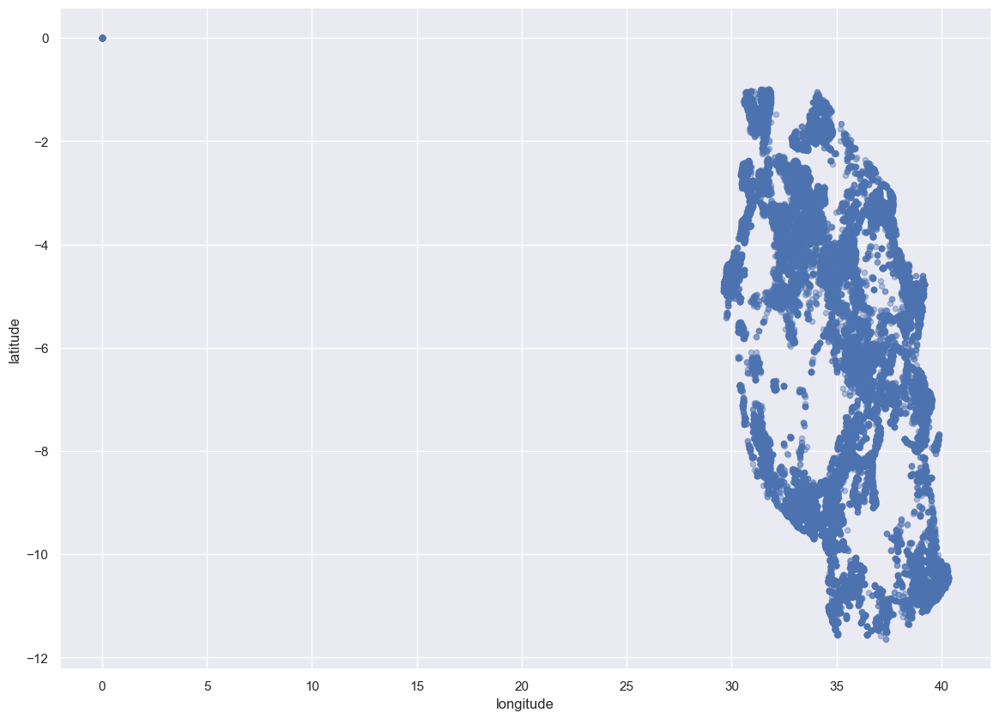

In [235]:
df.plot(kind='scatter', x="longitude", y="latitude", alpha=0.4, figsize=(14,10),sharex=False)
plt.show()

In [236]:
df.loc[df['longitude']==0]


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_name,permit,construction_year,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,status_group,decade,installer_cat,funder_cat
21,6091,0.0,2013-02-10,Dwsp,0,DWE,0.0,-2.000000e-08,Muungano,0,Lake Victoria,Ibabachegu,Shinyanga,17,1,Bariadi,Ikungulyabashashi,0,NaN,NaN,False,2000,swn 80,wug,unknown,unknown,unknown,shallow well,hand pump,functional,00s,DWE,Dwsp
53,32376,0.0,2011-08-01,Government Of Tanzania,0,Government,0.0,-2.000000e-08,Polisi,0,Lake Victoria,Center,Mwanza,19,6,Geita,Nyang'hwale,0,True,Nyang'hwale,True,2000,submersible,vwc,unknown,unknown,dry,machine dbh,communal standpipe multiple,non functional,00s,Government,Government Of Tanzania
168,72678,0.0,2013-01-30,Wvt,0,WVT,0.0,-2.000000e-08,Wvt Tanzania,0,Lake Victoria,Ilula,Shinyanga,17,1,Bariadi,Chinamili,0,False,NaN,False,2000,gravity,parastatal,other,soft,seasonal,rainwater harvesting,communal standpipe,functional,00s,Others,Others
177,56725,0.0,2013-01-17,Netherlands,0,DWE,0.0,-2.000000e-08,Kikundi Cha Wakina Mama,0,Lake Victoria,Mahaha,Shinyanga,17,1,Bariadi,Bunamhala,0,NaN,NaN,False,2000,other,wug,unknown,soft,enough,shallow well,other,non functional,00s,DWE,Others
253,13042,0.0,2012-10-29,Hesawa,0,DWE,0.0,-2.000000e-08,Kwakisusi,0,Lake Victoria,Nyamatala,Mwanza,19,2,Magu,Malili,0,True,NaN,True,2000,nira/tanira,vwc,never pay,soft,insufficient,shallow well,hand pump,functional needs repair,00s,DWE,Hesawa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59189,62177,0.0,2011-07-18,Dwsp,0,DWE,0.0,-2.000000e-08,Wazazo,0,Lake Victoria,Mwamabuli,Shinyanga,17,1,Bariadi,Mhunze,0,True,NaN,False,2000,nira/tanira,wug,other,soft,enough,shallow well,hand pump,functional needs repair,00s,DWE,Dwsp
59208,3631,0.0,2013-01-22,Dwsp,0,DWE,0.0,-2.000000e-08,Mtakuja,0,Lake Victoria,Mbiti,Shinyanga,17,1,Bariadi,Kinang'weli,0,NaN,NaN,False,2000,nira/tanira,wug,unknown,soft,enough,shallow well,hand pump,functional,00s,DWE,Dwsp
59295,60843,0.0,2011-07-19,Rwssp,0,DWE,0.0,-2.000000e-08,Maendeleo,0,Lake Victoria,Mwamalizi,Shinyanga,17,1,Bariadi,Chinamili,0,True,NaN,False,2000,nira/tanira,wug,never pay,soft,enough,shallow well,hand pump,functional needs repair,00s,DWE,Rwssp
59324,748,0.0,2013-01-22,World Vision,0,world vision,0.0,-2.000000e-08,Mwazwilo,0,Lake Victoria,Mbita,Shinyanga,17,1,Bariadi,Mbita,0,NaN,NaN,False,2000,nira/tanira,wug,unknown,soft,enough,shallow well,hand pump,functional,00s,world vision,World Vision


In [237]:
df[df['longitude']!=0].describe()


,id,amount_tsh,date_recorded,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,57588.00000,57588.000000,57588,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000
mean,37106.48807,327.645219,2012-03-25 18:58:12.727651328,689.325137,35.149669,-5.885572,0.489060,15.217615,5.728311,185.570831,1997.859919
min,0.00000,0.000000,2002-10-14 00:00:00,-90.000000,29.607122,-11.649440,0.000000,1.000000,0.000000,0.000000,1960.000000
25%,18522.75000,0.000000,2011-03-30 00:00:00,0.000000,33.285100,-8.643841,0.000000,5.000000,2.000000,0.000000,1995.000000
50%,37054.50000,0.000000,2012-10-08 00:00:00,426.000000,35.005943,-5.172704,0.000000,12.000000,3.000000,35.000000,2000.000000
75%,55667.25000,30.000000,2013-02-10 00:00:00,1332.000000,37.233712,-3.372824,0.000000,17.000000,5.000000,230.000000,2004.000000
max,74247.00000,350000.000000,2013-12-03 00:00:00,2770.000000,40.345193,-0.998464,1776.000000,99.000000,80.000000,30500.000000,2013.000000
std,21454.51421,3043.831403,NaN,693.564188,2.607428,2.809876,12.426954,17.855254,9.760254,477.744239,10.331744


In [ ]:
#Tanzania se encuentra sobre 29°E y 41°E asi que complicado que este en la longitud 0°. Entendemos que son valores missing asi que lo imputaremos sobre la media (sin tener en cuenta todas aquellas filas que estan en 0)
df['longitude'].replace(to_replace = 0 , value =35.15, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/2362089410.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['longitude'].replace(to_replace = 0 , value =35.15, inplace=True)


In [239]:
df['amount_tsh'].value_counts(normalize=True)

amount_tsh
0.0         0.700993
500.0       0.052222
50.0        0.041616
1000.0      0.025051
20.0        0.024630
              ...   
6300.0      0.000017
120000.0    0.000017
138000.0    0.000017
350000.0    0.000017
59.0        0.000017
Name: proportion, Length: 98, dtype: float64

In [240]:
#eliminamos amount_tsh ya que la mayoria de sus valores son 0
df.drop('amount_tsh', axis = 1, inplace = True)

In [241]:
#Las columnas wpt_name, scheme_name no aportan ninguna información útil sobre la funcionalidad. Por lo tanto, decidimos eliminarlas.
#También eliminamos la columna region_code porque la columna region ya proporciona más información.
df.drop(columns=['wpt_name', 'scheme_name', 'region_code'], inplace = True)

In [242]:
df.loc[df['population']!=0].describe()


,id,date_recorded,gps_height,longitude,latitude,num_private,district_code,population,construction_year
count,38019.000000,38019,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000
mean,37107.559115,2012-05-29 21:01:34.026670848,969.889634,36.074387,-6.139781,0.740788,6.299456,281.087167,1996.908283
min,1.000000,2004-01-07 00:00:00,-90.000000,29.607122,-11.649440,0.000000,1.000000,1.000000,1960.000000
25%,18514.500000,2011-03-22 00:00:00,347.000000,34.715340,-8.388839,0.000000,2.000000,40.000000,1988.000000
50%,37128.000000,2013-01-23 00:00:00,1135.000000,36.706815,-5.750877,0.000000,3.000000,150.000000,2000.000000
75%,55505.500000,2013-02-23 00:00:00,1465.000000,37.940149,-3.597016,0.000000,5.000000,324.000000,2008.000000
max,74247.000000,2013-12-03 00:00:00,2770.000000,40.345193,-1.042375,1776.000000,67.000000,30500.000000,2013.000000
std,21406.803661,NaN,612.544787,2.586779,2.737733,15.288297,11.303334,564.687660,12.425377


In [243]:
#imputamos los ceros de population por su media
df['population'].replace(to_replace = 0 , value =281, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/3430065381.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['population'].replace(to_replace = 0 , value =281, inplace=True)


In [244]:
#info no relevante
df.drop(columns=['date_recorded', 'num_private'],inplace=True )

In [245]:
#tenemos la variable region asi que la eliminamos tambien
df.drop('subvillage', axis = 1, inplace = True)

In [246]:
df['public_meeting'].fillna(value=True,inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/1712458126.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['public_meeting'].fillna(value=True,inplace=True)


In [247]:
df['permit'].fillna(value=True, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/819451403.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['permit'].fillna(value=True, inplace=True)


In [248]:
target_status_group = {'functional':0, 'functional needs repair': 1, 'non functional': 2} 
df['status_group'] = df['status_group'].replace(target_status_group)
df['status_group'].value_counts()

status_group
0    32259
2    22824
1     4317
Name: count, dtype: int64

In [249]:
df.to_csv('data_clean.csv')

In [250]:
df_clean = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/data_clean.csv')

In [251]:
pd.options.display.max_columns=100
df_clean

,Unnamed: 0,id,funder,gps_height,installer,longitude,latitude,basin,region,district_code,lga,ward,population,public_meeting,permit,construction_year,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,status_group,decade,installer_cat,funder_cat
0,0,69572,Roman,1390,Roman,34.938093,-9.856322,Lake Nyasa,Iringa,5,Ludewa,Mundindi,109,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,0,90s,Others,Others
1,1,8776,Grumeti,1399,GRUMETI,34.698766,-2.147466,Lake Victoria,Mara,2,Serengeti,Natta,280,True,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,0,10s,Others,Others
2,2,34310,Lottery Club,686,world vision,37.460664,-3.821329,Pangani,Manyara,4,Simanjiro,Ngorika,250,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,0,00s,world vision,Others
3,3,67743,Unicef,263,Unicef,38.486161,-11.155298,Ruvuma / Southern Coast,Mtwara,63,Nanyumbu,Nanyumbu,58,True,True,1986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,2,80s,Others,Unicef
4,4,19728,Action In A,0,Artisan,31.130847,-1.825359,Lake Victoria,Kagera,1,Karagwe,Nyakasimbi,281,True,True,2000,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,0,00s,Others,Others
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,59395,60739,Germany Republi,1210,CES,37.169807,-3.253847,Pangani,Kilimanjaro,5,Hai,Masama Magharibi,125,True,True,1999,gravity,water board,pay per bucket,soft,enough,spring,communal standpipe,0,90s,Others,Germany Republi
59396,59396,27263,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Rufiji,Iringa,4,Njombe,Ikondo,56,True,True,1996,gravity,vwc,pay annually,soft,enough,river,communal standpipe,0,90s,Others,Others
59397,59397,37057,Unknown,0,Unknown,34.017087,-8.750434,Rufiji,Mbeya,7,Mbarali,Chimala,281,True,False,2000,swn 80,vwc,pay monthly,fluoride,enough,machine dbh,hand pump,0,00s,Unknown,Unknown
59398,59398,31282,Malec,0,Musa,35.861315,-6.378573,Rufiji,Dodoma,4,Chamwino,Mvumi Makulu,281,True,True,2000,nira/tanira,vwc,never pay,soft,insufficient,shallow well,hand pump,0,00s,Others,Others


In [252]:
df_clean.drop(columns=['funder','installer','construction_year'],inplace=True )

In [253]:
print(df_clean.columns)

Index(['Unnamed: 0', 'id', 'gps_height', 'longitude', 'latitude', 'basin',
       'region', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'permit', 'extraction_type_group', 'management',
       'payment', 'water_quality', 'quantity', 'source', 'waterpoint_type',
       'status_group', 'decade', 'installer_cat', 'funder_cat'],
      dtype='object')


In [254]:
df_clean.drop('Unnamed: 0', axis = 1, inplace = True)

In [255]:
dff = df_clean.copy()

In [256]:
dff.drop(columns=['lga','ward','id'],inplace=True )

Al final decidimos hacer el modelo sin esas variables tampoco

In [257]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gps_height             59400 non-null  int64  
 1   longitude              59400 non-null  float64
 2   latitude               59400 non-null  float64
 3   basin                  59400 non-null  object 
 4   region                 59400 non-null  object 
 5   district_code          59400 non-null  int64  
 6   population             59400 non-null  int64  
 7   public_meeting         59400 non-null  bool   
 8   permit                 59400 non-null  bool   
 9   extraction_type_group  59400 non-null  object 
 10  management             59400 non-null  object 
 11  payment                59400 non-null  object 
 12  water_quality          59400 non-null  object 
 13  quantity               59400 non-null  object 
 14  source                 59400 non-null  object 
 15  wa

In [258]:
dff['public_meeting'] = dff['public_meeting'].astype(int)
dff['permit'] = dff['permit'].astype(int)

In [259]:
print("Columnas numéricas:")
print(dff.select_dtypes(include=['int64', 'float64']).columns)
print("\nColumnas categóricas:")
print(dff.select_dtypes(include=['object', 'category']).columns)
print("\nValores únicos por categórica:")
for col in dff.select_dtypes(include=['object', 'category']).columns:
    print(f"{col}: {dff[col].nunique()}")

Columnas numéricas:
Index(['gps_height', 'longitude', 'latitude', 'district_code', 'population',
       'public_meeting', 'permit', 'status_group'],
      dtype='object')

Columnas categóricas:
Index(['basin', 'region', 'extraction_type_group', 'management', 'payment',
       'water_quality', 'quantity', 'source', 'waterpoint_type', 'decade',
       'installer_cat', 'funder_cat'],
      dtype='object')

Valores únicos por categórica:
basin: 9
region: 21
extraction_type_group: 13
management: 12
payment: 7
water_quality: 8
quantity: 5
source: 10
waterpoint_type: 7
decade: 6
installer_cat: 17
funder_cat: 21


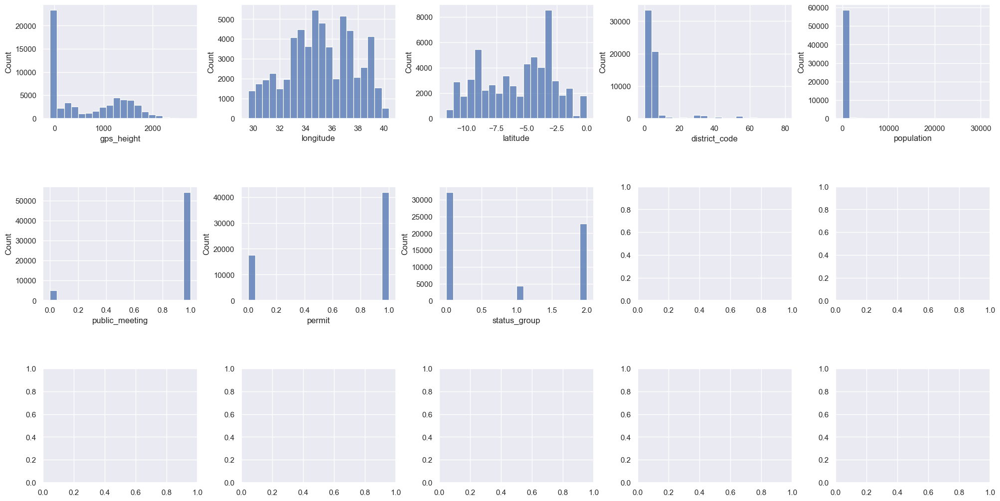

In [260]:
def plot_distributions(dff):
    fig, axs = plt.subplots(ncols=5, nrows=3, figsize=(20, 10))
    axs = axs.flatten()
    index = 0
    for k, v in dff.items():
        if k == 'permanencia':
            sns.countplot(v, ax=axs[index])
        else:
            sns.histplot(v, bins=20, ax=axs[index])
        index += 1
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
    plt.show()

plot_distributions(dff.select_dtypes(include=[np.number]))

In [261]:
categorical_cols = ['basin', 'region', 'extraction_type_group', 'management', 'payment', 
                    'water_quality', 'quantity', 'source', 'waterpoint_type', 'decade', 
                    'installer_cat', 'funder_cat']
for col in categorical_cols:
    print(f"{col}: {dff[col].nunique()} categorías")
    print(dff[col].value_counts())
    print()
   

basin: 9 categorías
basin
Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / Ruvu                 5987
Lake Nyasa                  5085
Ruvuma / Southern Coast     4493
Lake Rukwa                  2454
Name: count, dtype: int64

region: 21 categorías
region
Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: count, dtype: int64

extraction_type_group: 13 categorías
extraction_type_group
gravity            26780
nira/tanira         8154
other               643

In [262]:
target = 'status_group'
used_cols = [c for c in dff.columns.tolist() if c not in [target]]
X = dff[used_cols]
y = dff[target]

Ahora lo mismo pero con la parte de test

In [263]:
df_test['date_recorded'] = pd.to_datetime(df_test['date_recorded'])

In [264]:
df_test.isna().sum()

id                          0
amount_tsh                  0
date_recorded               0
funder                    870
gps_height                  0
installer                 877
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 99
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            821
recorded_by                 0
scheme_management         969
scheme_name              7242
permit                    737
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity  

In [265]:
df_test.drop(columns=['scheme_management', 'management_group', 'quantity_group', 'source_class', 'source_type', 'quality_group', 'payment_type', 'extraction_type_class', 'extraction_type', 'waterpoint_type_group'], inplace=True)

In [266]:
df_test['construction_year'] = df_test['construction_year'].replace(0, 2000)
df_test['decade'] = (df_test['construction_year'] // 10 * 10).astype(str).str[-2:] + 's'

In [267]:
df_test.drop('recorded_by', axis = 1, inplace = True)

In [268]:
df_test.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'scheme_name', 'permit',
       'construction_year', 'extraction_type_group', 'management', 'payment',
       'water_quality', 'quantity', 'source', 'waterpoint_type', 'decade'],
      dtype='object')

In [269]:
df_test['installer'].fillna(value='Unknown',inplace=True)
df_test['installer'].value_counts().head(100).sum()

df_test['installer'].replace(to_replace = '0', value ='Unknown' , inplace=True) 

df_test['installer'].replace(to_replace = ('District Water Department', 'District water depar','Distric Water Department'),
                        value ='District water department' , inplace=True)

df_test['installer'].replace(to_replace = ('FinW','Fini water','FINI WATER'), value ='Fini Water' , inplace=True)
df_test['installer'].replace(to_replace = 'JAICA', value ='Jaica' , inplace=True)

df_test['installer'].replace(to_replace = ('COUN', 'District COUNCIL', 'DISTRICT COUNCIL','District Counci', 
                                      'District Council','Council','Counc','District  Council','Distri'),
                                    value ='District council' , inplace=True)

df_test['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC','RC Ch','RC C', 'RC CH','RC church', 
                                      'RC CATHORIC',) , value ='RC Church' , inplace=True)

df_test['installer'].replace(to_replace = ('Central Government','Tanzania Government',
                                       'central government','Cental Government', 'Cebtral Government', 
                                      'Tanzanian Government','Tanzania government', 'Centra Government' ,
                                      'CENTRAL GOVERNMENT', 'TANZANIAN GOVERNMENT','Central govt', 'Centr', 
                                      'Centra govt') , value ='Central government' , inplace=True)

df_test['installer'].replace(to_replace = ('World vision', 'World Division','World Vision'),
                                        value ='world vision' , inplace=True)

df_test['installer'].replace(to_replace = ('Unisef','UNICEF'),value ='Unicef' , inplace=True)
df_test['installer'].replace(to_replace = 'DANID', value ='DANIDA' , inplace=True)

df_test['installer'].replace(to_replace = ('villigers', 'villager', 'Villagers', 'Villa', 'Village', 'Villi', 
                                      'Village Council','Village Counil', 'Villages', 'Vill', 'Village community', 
                                      'Villaers', 'Village Community', 'Villag','Villege Council', 'Village council',
                                      'Village  Council','Villagerd', 'Villager', 'Village Technician',
                                      'Village Office','Village community members'),
                                        value ='villagers' , inplace=True)

df_test['installer'].replace(to_replace =('Commu','Communit','commu','COMMU', 'COMMUNITY') ,
                                        value ='Community' , inplace=True)

df_test['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM','GOVERN','Gover','Gove',
                                      'Governme','Governmen' ) ,value ='Government' , inplace=True)

df_test['installer'].replace(to_replace = 'Hesawa' ,value ='HESAWA' , inplace=True)
df_test['installer'].replace(to_replace = ('Colonial Government') , value ='Colonial government' , inplace=True)
df_test['installer'].replace(to_replace = ('Government of Misri') , value ='Misri Government' , inplace=True)
df_test['installer'].replace(to_replace = ('Italy government') , value ='Italian government' , inplace=True)
df_test['installer'].replace(to_replace = ('British colonial government') , value ='British government' , inplace=True)
df_test['installer'].replace(to_replace = ('Concern /government') , value ='Concern/Government' , inplace=True)
df_test['installer'].replace(to_replace = ('Village Government') , value ='Village government' , inplace=True)
df_test['installer'].replace(to_replace = ('Government and Community') , value ='Government /Community' , inplace=True)
df_test['installer'].replace(to_replace = ('Cetral government /RC') , value ='RC church/Central Gover' , inplace=True)
df_test['installer'].replace(to_replace = ('Government /TCRS','Government/TCRS') , value ='TCRS /Government' , inplace=True)
df_test['installer'].replace(to_replace = ('ADRA /Government') , value ='ADRA/Government' , inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/362913105.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['installer'].fillna(value='Unknown',inplace=True)
/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/362913105.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting valu

In [270]:
dd_1 = df_test.loc[df_test['installer'] == 'DWE']
dd_2 = df_test.loc[df_test['installer'] == 'Unknown']              
dd_3 = df_test.loc[df_test['installer'] == 'Government'] 
dd_4 = df_test.loc[df_test['installer'] == 'Community'] 
dd_5 = df_test.loc[df_test['installer'] == 'DANIDA'] 
dd_6 = df_test.loc[df_test['installer'] == 'RWE'] 
dd_7 = df_test.loc[df_test['installer'] == 'District council'] 
dd_8 = df_test.loc[df_test['installer'] == 'Central government']
dd_9 = df_test.loc[df_test['installer'] == 'KKKT'] 
dd_10 = df_test.loc[df_test['installer'] == 'HESAWA'] 
dd_11 = df_test.loc[df_test['installer'] == 'TCRS'] 
dd_12 = df_test.loc[df_test['installer'] == 'world vision'] 
dd_13 = df_test.loc[df_test['installer'] == 'CES'] 
dd_14 = df_test.loc[df_test['installer'] == 'Fini Water'] 
dd_15 = df_test.loc[df_test['installer'] == 'RC Church'] 
dd_16 = df_test.loc[df_test['installer'] == 'villagers']
dd_17 = df_test.loc[df_test['installer'] == 'LGA']

df_installer = pd.concat([dd_1, dd_2, dd_3, dd_4, dd_5, dd_6, dd_7, dd_8, dd_9, dd_10, 
                         dd_11, dd_12, dd_13, dd_14, dd_15, dd_16, dd_17], ignore_index=True)

In [271]:
df_test['installer_cat'] = df_test['installer']

In [272]:
df_test['installer_cat'] = df_test['installer']
c_ins = ['DWE','Unknown','Government','Community','DANIDA','RWE','District council', 'Central government',
         'KKKT','HESAWA','TCRS', 'world vision', 'Fini Water', 'RC Church','villagers','LGA']


df_test.loc[~df_test["installer_cat"].isin(c_ins), "installer_cat"] = "Others"

In [273]:
df_test['funder'].fillna(value='Unknown',inplace=True)
df_test['funder'].replace(to_replace = '0', value ='Unknown' , inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/3982528821.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['funder'].fillna(value='Unknown',inplace=True)
/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/3982528821.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

In [274]:
f1 = df_test.loc[df_test['funder'] == 'Government Of Tanzania']
f2 = df_test.loc[df_test['funder'] == 'Unknown']              
f3 = df_test.loc[df_test['funder'] == 'Danida'] 
f4 = df_test.loc[df_test['funder'] == 'Hesawa'] 
f5 = df_test.loc[df_test['funder'] == 'Rwssp'] 
f6 = df_test.loc[df_test['funder'] == 'World Bank'] 
f7 = df_test.loc[df_test['funder'] == 'Kkkt'] 
f8 = df_test.loc[df_test['funder'] == 'World Vision']
f9 = df_test.loc[df_test['funder'] == 'Unicef'] 
f10 = df_test.loc[df_test['funder'] == 'Tasaf'] 
f11 = df_test.loc[df_test['funder'] == 'District Council'] 
f12 = df_test.loc[df_test['funder'] == 'Dhv'] 
f13 = df_test.loc[df_test['funder'] == 'Private Individual'] 
f14 = df_test.loc[df_test['funder'] == 'Dwsp'] 
f15 = df_test.loc[df_test['funder'] == 'Norad'] 
f16 = df_test.loc[df_test['funder'] == 'Germany Republi']
f17 = df_test.loc[df_test['funder'] == 'Tcrs']
f18 = df_test.loc[df_test['funder'] == 'Ministry Of Water']
f19 = df_test.loc[df_test['funder'] == 'Water']
f20 = df_test.loc[df_test['funder'] == 'Dwe']

df_funder = pd.concat([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10, 
                       f11, f12, f13, f14, f15, f16, f17, f18, f19, f20], 
                       ignore_index=True)

In [275]:
df_test['funder_cat'] = df_test['funder']

c_fund = ['Danida', 'Unknown', 'Government Of Tanzania', 'Hesawa', 'Rwssp', 'World Bank', 
          'Kkkt', 'World Vision', 'Unicef', 'Tasaf', 'District Council', 'Dhv', 
          'Private Individual', 'Dwsp', 'Norad', 'Germany Republi', 'Tcrs', 
          'Ministry Of Water', 'Water', 'Dwe']

df_test.loc[~df_test["funder_cat"].isin(c_fund), "funder_cat"] = "Others"
df_test['funder_cat'].nunique()

21

In [276]:
df_test.loc[df_test['longitude']==0]


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_name,permit,construction_year,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,decade,installer_cat,funder_cat
28,44718,0.0,2013-02-04,Dwsp,0,DWE,0.0,-2.000000e-08,Nkubanija,0,Lake Victoria,Nkonze,Shinyanga,17,1,Bariadi,Lugulu,0,True,NaN,False,2000,nira/tanira,wug,pay when scheme fails,salty abandoned,enough,shallow well,hand pump,00s,DWE,Dwsp
55,15962,0.0,2011-08-01,Hesawa,0,HESAWA,0.0,-2.000000e-08,Bombani,0,Lake Victoria,Nyang'Hulukulu,Mwanza,19,6,Geita,Nyang'hwale,0,True,Borehole,True,2000,other,vwc,unknown,unknown,dry,machine dbh,other,00s,HESAWA,Hesawa
68,45374,0.0,2013-02-16,Dwsp,0,DWE,0.0,-2.000000e-08,Maendeleo,0,Lake Victoria,Magua,Mwanza,17,1,Magu,Nkungulu,0,NaN,NaN,False,2000,nira/tanira,wug,unknown,soft,enough,shallow well,hand pump,00s,DWE,Dwsp
139,68616,0.0,2011-07-19,Plan International,0,Plan Internationa,0.0,-2.000000e-08,Mwatulole,0,Lake Victoria,Ihayabuyaga,Mwanza,19,6,Geita,Kalangalala,0,True,Borehole,True,2000,india mark ii,vwc,never pay,soft,insufficient,machine dbh,hand pump,00s,Others,Others
150,51539,0.0,2013-02-09,Dwsp,0,DWE,0.0,-2.000000e-08,Mwashidakwa,0,Lake Victoria,Magongolo,Shinyanga,17,1,Bariadi,Gamboshi,0,NaN,NaN,False,2000,nira/tanira,wug,unknown,soft,enough,shallow well,hand pump,00s,DWE,Dwsp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14649,30454,0.0,2011-08-08,Nyamigogo,0,MASWI,0.0,-2.000000e-08,Husein,0,Lake Victoria,Nyaweshi,Mwanza,19,6,Geita,Kharumwa,0,True,Borehole,True,2000,india mark ii,vwc,never pay,soft,insufficient,shallow well,hand pump,00s,Others,Others
14676,44766,0.0,2013-02-16,Dwsp,0,DWE,0.0,-2.000000e-08,Imalanota,0,Lake Victoria,Busumabwi,Mwanza,17,1,Magu,Nkungulu,0,False,NaN,False,2000,swn 80,wug,other,soft,enough,shallow well,hand pump,00s,DWE,Dwsp
14766,56279,0.0,2012-11-04,Government Of Tanzania,0,RWE,0.0,-2.000000e-08,Ofisini,0,Lake Victoria,Madukani,Mwanza,19,2,Magu,Mkula,0,True,Kalemela Water Supply,True,2000,gravity,vwc,never pay,soft,insufficient,lake,communal standpipe multiple,00s,RWE,Government Of Tanzania
14831,37994,0.0,2012-10-26,Hesawa,0,DWE,0.0,-2.000000e-08,Kwa Masilili,0,Lake Victoria,Solima A,Mwanza,19,2,Magu,Kabita,0,True,NaN,True,2000,nira/tanira,vwc,never pay,salty,enough,shallow well,hand pump,00s,DWE,Hesawa


In [277]:
df_test['longitude'].replace(to_replace = 0 , value =35.15, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/1037781564.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['longitude'].replace(to_replace = 0 , value =35.15, inplace=True)


In [278]:
df_test.drop('amount_tsh', axis = 1, inplace = True)

In [279]:
df_test.drop(columns=['wpt_name', 'scheme_name', 'region_code'], inplace = True)

In [280]:
df_test['population'].replace(to_replace = 0 , value =281, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/828379865.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['population'].replace(to_replace = 0 , value =281, inplace=True)


In [281]:
df_test.drop(columns=['date_recorded', 'num_private'],inplace=True )

In [282]:
df_test.drop('subvillage', axis = 1, inplace = True)

In [283]:
df_test['public_meeting'].fillna(value=True,inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/4263534688.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['public_meeting'].fillna(value=True,inplace=True)


In [284]:
df_test['permit'].fillna(value=True, inplace=True)

/var/folders/yc/s386fz7n3kz_36rsqpygqbsm0000gn/T/ipykernel_13141/1759702469.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['permit'].fillna(value=True, inplace=True)


In [285]:
df_test.to_csv('data_clean_prediction.csv')

In [286]:
df_test_clean = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/data_clean_prediction.csv')

In [287]:
df_test_clean.drop(columns=['funder','installer','construction_year', 'Unnamed: 0', 'lga','ward','id'],inplace=True )

In [288]:
df_test_clean['public_meeting'] = df_test_clean['public_meeting'].astype(int)
df_test_clean['permit'] = df_test_clean['permit'].astype(int)

In [289]:
df_test_clean.columns

Index(['gps_height', 'longitude', 'latitude', 'basin', 'region',
       'district_code', 'population', 'public_meeting', 'permit',
       'extraction_type_group', 'management', 'payment', 'water_quality',
       'quantity', 'source', 'waterpoint_type', 'decade', 'installer_cat',
       'funder_cat'],
      dtype='object')

### Transformación de variables categóricas para el modelo

En esta sección, realizamos distintas estrategias de codificación de variables categóricas con el objetivo de que puedan ser utilizadas por algoritmos de machine learning, especialmente modelos basados en árboles como Random Forest o XGBoost. No se aplicó escalado (normalización o estandarización) a las variables numéricas porque los modelos utilizados (Random Forest, XGBoost y LightGBM) están basados en árboles de decisión. Este tipo de algoritmos no se ve afectado por la escala de las variables, ya que toman decisiones mediante umbrales y no calculan distancias como ocurre en modelos lineales o basados en vecinos.

1. One-Hot Encoding (`get_dummies`)
   Aplicado a variables con pocas categorías (`basin`, `payment`, `water_quality`, `source`, `waterpoint_type`).  
   Se eliminó la primera categoría (`drop_first=True`) para evitar colinealidad.  
   Se alinearon `X_train` y `X_test` para que tuvieran las mismas columnas después de la codificación.

2. Target Encoding
   Aplicado a `region`, `installer_cat` y `funder_cat`, variables con muchas categorías.  
   Se codificaron en función de la variable objetivo (`y_train`) utilizando la media de cada categoría.  
   Esta técnica es útil cuando el número de categorías es elevado, ya que reduce dimensionalidad.

3. Label Encoding
   Utilizado en `extraction_type_group` y `management`, donde las categorías se reemplazan por números.  
   Es adecuado para modelos de árboles, que no son sensibles al orden numérico arbitrario.

4. Ordinal Encoding (Mapeo manual)  
   Para las variables `quantity` y `decade`, donde existe un orden lógico entre las categorías.  
   Se asignaron valores numéricos según el orden que representan (ej., de “dry” a “enough”).

5. Alineación de columnas
   Después de aplicar `get_dummies`, se usó `align()` para asegurar que `X_train` y `X_test` tuvieran la misma estructura de columnas, rellenando con ceros donde faltaran categorías.

In [290]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify = y)
print("Proporciones en y_train:")
print(y_train.value_counts(normalize=True))
print("Proporciones en y_test:")
print(y_test.value_counts(normalize=True))

Proporciones en y_train:
status_group
0    0.543078
2    0.384235
1    0.072688
Name: proportion, dtype: float64
Proporciones en y_test:
status_group
0    0.543098
2    0.384287
1    0.072615
Name: proportion, dtype: float64


In [291]:
X_train = pd.get_dummies(X_train, columns=['basin'], prefix='basin', drop_first=True)
X_test = pd.get_dummies(X_test, columns=['basin'], prefix='basin', drop_first=True)
X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)
df_test_clean = pd.get_dummies(df_test_clean, columns=['basin'], prefix='basin', drop_first=True)


In [292]:
from category_encoders import TargetEncoder
te = TargetEncoder()
X_train[['region', 'installer_cat', 'funder_cat']] = te.fit_transform(X_train[['region', 'installer_cat', 'funder_cat']], y_train)
X_test[['region', 'installer_cat', 'funder_cat']] = te.transform(X_test[['region', 'installer_cat', 'funder_cat']])
df_test_clean[['region', 'installer_cat', 'funder_cat']] = te.transform(df_test_clean[['region', 'installer_cat', 'funder_cat']])

In [293]:
print(df_test_clean.columns)

Index(['gps_height', 'longitude', 'latitude', 'region', 'district_code',
       'population', 'public_meeting', 'permit', 'extraction_type_group',
       'management', 'payment', 'water_quality', 'quantity', 'source',
       'waterpoint_type', 'decade', 'installer_cat', 'funder_cat',
       'basin_Lake Nyasa', 'basin_Lake Rukwa', 'basin_Lake Tanganyika',
       'basin_Lake Victoria', 'basin_Pangani', 'basin_Rufiji',
       'basin_Ruvuma / Southern Coast', 'basin_Wami / Ruvu'],
      dtype='object')


In [294]:
from sklearn.preprocessing import LabelEncoder
X_train['extraction_type_group'] = LabelEncoder().fit_transform(X_train['extraction_type_group'])
X_test['extraction_type_group'] = LabelEncoder().fit_transform(X_test['extraction_type_group'])
df_test_clean['extraction_type_group'] = LabelEncoder().fit_transform(df_test_clean['extraction_type_group'])

In [295]:
# Codificar management (Label Encoding)
X_train['management'] = LabelEncoder().fit_transform(X_train['management'])
X_test['management'] = LabelEncoder().fit_transform(X_test['management'])
df_test_clean['management'] = LabelEncoder().fit_transform(df_test_clean['management'])
# Codificar payment (One-Hot)
X_train = pd.get_dummies(X_train, columns=['payment'], prefix='payment', drop_first=True)
X_test = pd.get_dummies(X_test, columns=['payment'], prefix='payment', drop_first=True)
df_test_clean = pd.get_dummies(df_test_clean, columns=['payment'], prefix='payment', drop_first=True)

# Codificar water_quality (One-Hot)
X_train = pd.get_dummies(X_train, columns=['water_quality'], prefix='water_quality', drop_first=True)
X_test = pd.get_dummies(X_test, columns=['water_quality'], prefix='water_quality', drop_first=True)
df_test_clean = pd.get_dummies(df_test_clean, columns=['water_quality'], prefix='water_quality', drop_first=True)

# Codificar quantity (Ordinal Encoding)
quantity_order = {'dry': 0, 'insufficient': 1, 'seasonal': 2, 'enough': 3, 'unknown': 4}
X_train['quantity'] = X_train['quantity'].map(quantity_order)
X_test['quantity'] = X_test['quantity'].map(quantity_order)
quantity_order = {'dry': 0, 'insufficient': 1, 'seasonal': 2, 'enough': 3, 'unknown': 4}
df_test_clean['quantity'] = df_test_clean['quantity'].map(quantity_order)

# Codificar source (One-Hot)
X_train = pd.get_dummies(X_train, columns=['source'], prefix='source', drop_first=True)
X_test = pd.get_dummies(X_test, columns=['source'], prefix='source', drop_first=True)
X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)
df_test_clean = pd.get_dummies(df_test_clean, columns=['source'], prefix='source', drop_first=True)

# Codificar waterpoint_type (One-Hot)
X_train = pd.get_dummies(X_train, columns=['waterpoint_type'], prefix='waterpoint_type', drop_first=True)
X_test = pd.get_dummies(X_test, columns=['waterpoint_type'], prefix='waterpoint_type', drop_first=True)
X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)
df_test_clean = pd.get_dummies(df_test_clean, columns=['waterpoint_type'], prefix='waterpoint_type', drop_first=True)

# Codificar decade (Ordinal Encoding)
decade_order = {'60s': 0, '70s': 1, '80s': 2, '90s': 3, '00s': 4, '10s': 5}
X_train['decade'] = X_train['decade'].map(decade_order)
X_test['decade'] = X_test['decade'].map(decade_order)
decade_order = {'60s': 0, '70s': 1, '80s': 2, '90s': 3, '00s': 4, '10s': 5}
df_test_clean['decade'] = df_test_clean['decade'].map(decade_order)

## 5. Modelado

In [297]:
from sklearn.metrics import classification_report

def saca_metricas(y1, y2):
    print('Matriz de Confusión')
    print(confusion_matrix(y1, y2))
    print('Accuracy:', accuracy_score(y1, y2))
    print('Precision:', precision_score(y1, y2, average='macro'))
    print('Recall:', recall_score(y1, y2, average='macro'))
    print('F1 Score:', f1_score(y1, y2, average='macro'))

    print("\nReporte por clase:")
    print(classification_report(y1, y2))

### 5.1 Modelo de Naive-Bayes

In [298]:
from sklearn.naive_bayes import GaussianNB
model_nb = GaussianNB()
model_nb.fit(X_train, y_train)
y_nb = model_nb.predict(X_test)
saca_metricas(y_test, y_nb)

Matriz de Confusión
[[2683 1423  733]
 [ 192  338  117]
 [ 833  971 1620]]
Accuracy: 0.5208754208754208
Precision: 0.5010533302142953
Recall: 0.5166651229561946
F1 Score: 0.45919779600702504

Reporte por clase:
              precision    recall  f1-score   support

           0       0.72      0.55      0.63      4839
           1       0.12      0.52      0.20       647
           2       0.66      0.47      0.55      3424

    accuracy                           0.52      8910
   macro avg       0.50      0.52      0.46      8910
weighted avg       0.65      0.52      0.57      8910



### 5.2 Modelo Random Forest    

In [300]:
model_rfc = RandomForestClassifier(random_state=42)

In [ ]:
print(X_train.dtypes)
print(X_test.dtypes)

gps_height                 int64
longitude                float64
latitude                 float64
basin                     object
region                    object
district_code              int64
population                 int64
public_meeting             int64
permit                     int64
extraction_type_group     object
management                object
payment                   object
water_quality             object
quantity                  object
source                    object
waterpoint_type           object
decade                    object
installer_cat             object
funder_cat                object
dtype: object
gps_height                 int64
longitude                float64
latitude                 float64
basin                     object
region                    object
district_code              int64
population                 int64
public_meeting             int64
permit                     int64
extraction_type_group     object
management                obj

In [301]:
model_rfc.fit(X_train,y_train)
y_pred = model_rfc.predict(X_test)

In [302]:
saca_metricas(y_test, y_pred)

Matriz de Confusión
[[4304  143  392]
 [ 340  201  106]
 [ 681   54 2689]]
Accuracy: 0.8074074074074075
Precision: 0.7190094103221943
Recall: 0.6618144526184357
F1 Score: 0.6816974413500141

Reporte por clase:
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      4839
           1       0.51      0.31      0.38       647
           2       0.84      0.79      0.81      3424

    accuracy                           0.81      8910
   macro avg       0.72      0.66      0.68      8910
weighted avg       0.80      0.81      0.80      8910



Vemos que el modelo random forest predice basante bien la clase 0 y 2 pero no asi la 1. Con un accuracy general del 0.8074074074074075. Vamos a intentar mejorarlo tuneando los hiperparametros. A continuacion hice dos grid search uno scoring = f1_macro y el siguiente accuracy. Subi ambos a la competicion y quedo claro ganador el de accuracy. 

#### 5.2.1 Random Forest Grid Search f1_macro

In [ ]:
grid_param = {
    'n_estimators': [200, 300, 400],
    'max_depth': [None, 40, 50],
    'min_samples_split': [2, 3],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt'],
    'criterion': ['gini', 'entropy'],
    'class_weight': [None, 'balanced']
}

stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=42)

model_grid = GridSearchCV(estimator=model_rfc,
                          param_grid=grid_param,
                          scoring='f1_macro',  
                          cv=stratified_kfold,               
                          n_jobs=-1,           
                          verbose=1)         

model_grid.fit(X_train, y_train)

print("Mejores hiperparámetros:", model_grid.best_params_)
print("Mejor accuracy en validación cruzada:", model_grid.best_score_)

y_pred_best_f1 = model_grid.predict(X_test)
print("Accuracy en el conjunto de prueba:", accuracy_score(y_test, y_pred_best_f1))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


/opt/anaconda3/envs/ML_enviroment/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores hiperparámetros: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 40, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 400}
Mejor accuracy en validación cruzada: 0.6990507645784807
Accuracy en el conjunto de prueba: 0.7952861952861953


#### 5.2.2 Random Forest Grid Search accuracy

In [ ]:
grid_param = {
    'n_estimators': [200, 300, 400],
    'max_depth': [None, 40, 50],
    'min_samples_split': [2, 3],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt'],
    'criterion': ['gini', 'entropy'],
    'class_weight': [None, 'balanced']
}

stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=42)

model_grid = GridSearchCV(estimator=model_rfc,
                          param_grid=grid_param,
                          scoring='accuracy',  
                          cv=stratified_kfold,               
                          n_jobs=-1,           
                          verbose=1)         

model_grid.fit(X_train, y_train)

print("Mejores hiperparámetros:", model_grid.best_params_)
print("Mejor accuracy en validación cruzada:", model_grid.best_score_)

y_pred_acc = model_grid.predict(X_test)
print("Accuracy en el conjunto de prueba:", accuracy_score(y_test, y_pred_acc))

Al cerrar y volver a abrir el notebook se perdió la salida de la celda, pero había anotado previamente los resultados. Durante la validación cruzada del modelo (5 folds y 216 combinaciones de hiperparámetros, totalizando 1080 ejecuciones), se mostró una advertencia relacionada con la paralelización de procesos, posiblemente por un tiempo de espera corto o una fuga de memoria. Los mejores hiperparámetros encontrados fueron: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 400}. El mejor resultado de accuracy obtenido durante la validación cruzada fue de 0.8089, y el accuracy final sobre el conjunto de prueba fue de 0.8152.

Ya con un claro ganador, el siguiente paso era como poder mejorar el precision y recall de la clase 1. Esto tambien es asi en parte por lo desbalanceada que esta la clase 1 respecto de la 0 y 2. Asi que haremos oversampling de la clase 1, generaremos nuevos ejemplos sinteticos para ver si así mejora.

#### 5.2.3 Random Forest con SMOTE

In [305]:
from collections import Counter
class_counts = Counter(y_train)  


strategy_dict = {1: class_counts[2]}  #aqui igualamos la clase 1 a la 2. Tambien probe con 'auto' u con 'minority'.

smote = SMOTE(sampling_strategy=strategy_dict, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("Distribución original:", class_counts)
print("Nueva distribución:", Counter(y_train_resampled))

Distribución original: Counter({0: 27420, 2: 19400, 1: 3670})
Nueva distribución: Counter({0: 27420, 2: 19400, 1: 19400})


In [ ]:
grid_param = {
    'n_estimators': [300, 400, 500],
    'max_depth': [None, 40, 50],
    'min_samples_split': [2, 3],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt'],
    'criterion': ['gini', 'entropy'],
    'class_weight': [None, 'balanced']
}

stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=42)

model_grid_sm = GridSearchCV(estimator=model_rfc,
                          param_grid=grid_param,
                          scoring='accuracy',  
                          cv=stratified_kfold,               
                          n_jobs=-1,           
                          verbose=1)         

model_grid_sm.fit(X_train_resampled, y_train_resampled)

print("Mejores hiperparámetros:", model_grid_sm.best_params_)
print("Mejor accuracy en validación cruzada:", model_grid_sm.best_score_)

y_pred_sm = model_grid_sm.predict(X_test)
print("Accuracy en el conjunto de prueba:", accuracy_score(y_test, y_pred_sm))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


/opt/anaconda3/envs/ML_enviroment/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores hiperparámetros: {'class_weight': None, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 400}
Mejor accuracy en validación cruzada: 0.8462247055270311
Accuracy en el conjunto de prueba: 0.7991021324354658


Vemos que baja un poco el accuracy, lo subi de todas formas a ver que tal puntuaba y bajo la puntuacion también. Asi que nos quedamos con el modelo de random forest tuneado sin smote

In [308]:
model_rfc_accuracy = RandomForestClassifier(
    n_estimators=400,
    max_depth=None,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    criterion='entropy',
    class_weight=None,
    random_state=42
)

In [309]:
model_rfc_accuracy.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', min_samples_leaf=2,
                       n_estimators=400, random_state=42)

In [310]:
Y_pred_acc = model_rfc_accuracy.predict(X_test)

In [311]:
saca_metricas(y_test, Y_pred_acc)




Matriz de Confusión
[[4451   73  315]
 [ 372  172  103]
 [ 753   31 2640]]
Accuracy: 0.8151515151515152
Precision: 0.7615800753446272
Recall: 0.6522295103107796
F1 Score: 0.6806632959225066

Reporte por clase:
              precision    recall  f1-score   support

           0       0.80      0.92      0.85      4839
           1       0.62      0.27      0.37       647
           2       0.86      0.77      0.81      3424

    accuracy                           0.82      8910
   macro avg       0.76      0.65      0.68      8910
weighted avg       0.81      0.82      0.80      8910



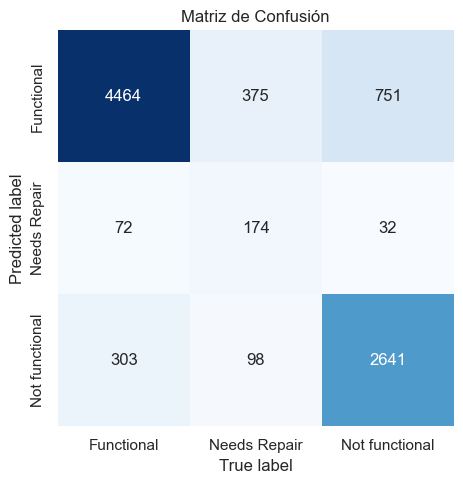

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(y_test, Y_pred_acc)

labels = ['Functional', 'Needs Repair', 'Not functional']

plt.figure(figsize=(6, 5))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

Vemos que tiene buena precision en las clases 0 y 2 pero no asi en la 1 que confunde muchos con Functional (375) y algunos con Not Functional (98). Esto puede ser debido al desbalance de la clase minoritaria. Vamos a ver como podemos mejorar la clase 1

In [ ]:
X_submission = df_test_clean.copy()
y_pred_submission_acc = model_rfc_accuracy.predict(X_submission)  

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')  # Contiene la columna 'id'
label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}

if isinstance(y_pred_submission_acc[0], (int, np.integer)):
    y_pred_submission_acc = [label_mapping[i] for i in y_pred_submission_acc]

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_submission_acc
})

df_submission.to_csv('submission_rfc_acc_3.csv', index=False)
print("Archivo 'submission_rfc.csv' guardado con éxito.")

Archivo 'submission_rfc.csv' guardado con éxito.


In [ ]:
model_rfc_f1macro = RandomForestClassifier(
    n_estimators=400,
    max_depth=40,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    criterion='gini',
    class_weight='balanced',
    random_state=42
)

In [ ]:
model_rfc_f1macro.fit(X_train, y_train)
Y_pred_f1 = model_rfc_f1macro.predict(X_test)

In [ ]:
saca_metricas(y_test, Y_pred_f1)
#El modelo random forest con scoring = F1_macro nos aumenta precision y recall de la clase 1 pero nos baja el accuracy general, dando como resultado al subirlo a la competicion una bajada de puntuación.

Matriz de Confusión
[[4082  369  388]
 [ 235  328   84]
 [ 616  132 2676]]
Accuracy: 0.7952861952861953
Precision: 0.691069764928379
Recall: 0.7106866511294522
F1 Score: 0.6980855440657989

Reporte por clase:
              precision    recall  f1-score   support

           0       0.83      0.84      0.84      4839
           1       0.40      0.51      0.44       647
           2       0.85      0.78      0.81      3424

    accuracy                           0.80      8910
   macro avg       0.69      0.71      0.70      8910
weighted avg       0.80      0.80      0.80      8910



In [ ]:
y_pred_submission_f1 = model_rfc_f1macro.predict(X_submission)  

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')  # Contiene la columna 'id'
label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}

if isinstance(y_pred_submission_f1[0], (int, np.integer)):
    y_pred_submission_f1 = [label_mapping[i] for i in y_pred_submission_f1]

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_submission_f1
})

df_submission.to_csv('submission_rfc_f1.csv', index=False)
print("Archivo 'submission_rfc.csv' guardado con éxito.")

Archivo 'submission_rfc.csv' guardado con éxito.


Visto Random Forest vamos a probar otros modelos

### 5.3 Modelo Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
gbc = GradientBoostingClassifier()
gbc.fit(X_train,y_train)
Y_pred_gbc = gbc.predict(X_test)

saca_metricas(y_test, Y_pred_gbc)


Matriz de Confusión
[[4461   23  355]
 [ 452   87  108]
 [1252   22 2150]]
Accuracy: 0.7517396184062851
Precision: 0.7351669713637249
Recall: 0.5614240057909284
F1 Score: 0.5821445562835449

Reporte por clase:
              precision    recall  f1-score   support

           0       0.72      0.92      0.81      4839
           1       0.66      0.13      0.22       647
           2       0.82      0.63      0.71      3424

    accuracy                           0.75      8910
   macro avg       0.74      0.56      0.58      8910
weighted avg       0.76      0.75      0.73      8910



### 5.4 Modelo XGBoost Classifier

In [313]:
model_xgb = XGBClassifier(
    n_estimators=500)
    
model_xgb.fit(X_train,y_train)
Y_pred_xgb = model_xgb.predict(X_test)

saca_metricas(y_test, Y_pred_xgb)


Matriz de Confusión
[[4324  129  386]
 [ 345  200  102]
 [ 690   54 2680]]
Accuracy: 0.8085297418630752
Precision: 0.7250065867458487
Recall: 0.6618007811588422
F1 Score: 0.6831552414300411

Reporte por clase:
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      4839
           1       0.52      0.31      0.39       647
           2       0.85      0.78      0.81      3424

    accuracy                           0.81      8910
   macro avg       0.73      0.66      0.68      8910
weighted avg       0.80      0.81      0.80      8910



Mejora la clase 1 pero no lo suficiente y baja el accuracy general

### 5.5 Modelo Light Gradient Boosting Machine Classifier

In [ ]:
import lightgbm as lgb
from lightgbm import LGBMClassifier

model_lgb = LGBMClassifier(
    objective='multiclass',
    num_class=3,
    random_state=42,
    n_estimators=300,
    learning_rate=0.1,
    max_depth=7,
    class_weight='balanced',
)

model_lgb.fit(X_train, y_train)

y_pred_lgb = model_lgb.predict(X_test)

saca_metricas(y_test, y_pred_lgb)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1203
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

Ahora visto que Random Forest y XGBoost son buenos para la clase 0 y 2 y el LGBM Classifier es bueno para la 1. Vamos a hacer dos ensemble diferentes con los 3 modelos. Uno de voting 'hard' que es por mayoría de votos y otro de stacking en el que los tres modelos alimentaran una regresion logisitica(modelo meta).

## 6. Enssemble Learning: Voting y Stacking

En esta sección se aplicaron dos técnicas de ensemble learning:
- Voting Classifier (Hard Voting): combinación de predicciones de varios modelos base (Random Forest, XGBoost, LGBM) mediante mayoría de votos.

- Stacking Classifier: ensamblado jerárquico donde los modelos base generan predicciones que sirven de entrada a un modelo final (meta-modelo) encargado de combinar los resultados.
Estas técnicas permitieron mejorar ligeramente el rendimiento del modelo respecto a los modelos individuales.

### 6.1 Voting (Hard) 

In [ ]:
from sklearn.ensemble import VotingClassifier
ensemble_voting = VotingClassifier(
    estimators=[
        ('rf', model_rfc_accuracy),
        ('xgb', model_xgb),
        ('lgb', model_lgb)
    ],
    voting='hard',  
    n_jobs=-1
)

In [317]:
ensemble_voting.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1203
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(criterion='entropy',
                                                     min_samples_leaf=2,
                                                     n_estimators=400,
                                                     random_state=42)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            featu...
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=500, n_jobs=None,
                                            num_parallel_tree=None, ...)),
                             ('lgb',
                              LGBMClassifier(class_weight='balanced',
                                             max_depth=7, n_estimators=300,
                                             num_class=3,
                                             objective='multiclass',
                                             random_state=42))],
                 n_jobs=-1)

In [318]:
y_pred_ensemble = ensemble_voting.predict(X_test)

In [319]:
print("Accuracy ensemble:", accuracy_score(y_test, y_pred_ensemble))
print("Reporte clasificación ensemble:\n")
print(classification_report(y_test, y_pred_ensemble))
saca_metricas(y_test, y_pred_ensemble)

Accuracy ensemble: 0.8120089786756454
Reporte clasificación ensemble:

              precision    recall  f1-score   support

           0       0.80      0.90      0.85      4839
           1       0.52      0.33      0.40       647
           2       0.86      0.78      0.82      3424

    accuracy                           0.81      8910
   macro avg       0.73      0.67      0.69      8910
weighted avg       0.81      0.81      0.81      8910

Matriz de Confusión
[[4366  140  333]
 [ 350  215   82]
 [ 709   61 2654]]
Accuracy: 0.8120089786756454
Precision: 0.7287987833552348
Recall: 0.6698907635250949
F1 Score: 0.6909172462807865

Reporte por clase:
              precision    recall  f1-score   support

           0       0.80      0.90      0.85      4839
           1       0.52      0.33      0.40       647
           2       0.86      0.78      0.82      3424

    accuracy                           0.81      8910
   macro avg       0.73      0.67      0.69      8910
weighted avg

Vemos que mejora un poco el accuracy y la clase 1 tambien algo. Vamos por buen camino

In [ ]:
X_submission = df_test_clean.copy()
y_pred_submission_ens = ensemble_voting.predict(X_submission)  

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')  # Contiene la columna 'id'
label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}

y_pred_labels = [label_mapping[i] for i in y_pred_submission_ens]

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_labels
})

df_submission.to_csv('submission_ensemble.csv', index=False)
print("Archivo 'submission_ensemble.csv' guardado con éxito.")

Archivo 'submission_ensemble.csv' guardado con éxito.


### 6.2 Stacking

Ahora aplicamos aqui un ensemble stacking y vemos que mejora aun más asi que nos vamos a quedar con este pero antes tunearemos los hiperparametros del modelo xgb y lgb a ver si podemos mejorar.

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
estimators = [
    ('rf', model_rfc_accuracy),       
    ('xgb', model_xgb),
    ('lgb', model_lgb)         
]

stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(),
    cv=stratified_kfold,
    n_jobs=-1
)

stacking_clf.fit(X_train, y_train)

y_pred_stack = stacking_clf.predict(X_test)
print(classification_report(y_test, y_pred_stack))
print("Accuracy ensemble:", accuracy_score(y_test, y_pred_stack))
saca_metricas(y_test, y_pred_stack)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1203
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [ ]:
X_submission = df_test_clean.copy()
y_pred_submission_ens = stacking_clf.predict(X_submission) 

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')  # Contiene la columna 'id'
label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}

y_pred_labels = [label_mapping[i] for i in y_pred_submission_ens]

df_ids = pd.read_csv(r'/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_labels
})

df_submission.to_csv('submission_ensemble_rxl.csv', index=False)
print("Archivo 'submission_ensemble_rxl.csv' guardado con éxito.")

Archivo 'submission_ensemble_rxl.csv' guardado con éxito.


#### 6.2.1 Tuneos para modelo Stacking

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [5, 7, 10],
    'num_leaves': [20, 31, 50],
    'min_child_samples': [10, 20, 30]
}

cv = stratified_kfold

random_search_lgb = RandomizedSearchCV(
    estimator=model_lgb,
    param_distributions=param_grid,
    n_iter=30, 
    scoring='accuracy',
    cv=cv,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

random_search_lgb.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Auto-choosing row-wi

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=LGBMClassifier(class_weight='balanced',
                                            max_depth=7, n_estimators=300,
                                            num_class=3, objective='multiclass',
                                            random_state=42),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [5, 7, 10],
                                        'min_child_samples': [10, 20, 30],
                                        'n_estimators': [100, 200, 300],
                                        'num_leaves': [20, 31, 50]},
                   random_state=42, scoring='accuracy', verbose=1)

In [323]:
model_lgb_tuned = LGBMClassifier(
            class_weight='balanced',
            learning_rate=0.2,
            max_depth=7,
            min_child_samples=30,
            n_estimators=300,
            num_class=3,
            num_leaves=50,
            objective='multiclass',
            random_state=42)

model_lgb_tuned.fit(X_train, y_train)
y_lgb_tun = model_lgb_tuned.predict(X_test)
saca_metricas(y_test, y_lgb_tun)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1203
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
estimators = [
    ('rf', model_rfc_accuracy),       
    ('xgb', model_xgb),
    ('lgb', model_lgb_tuned)          
]

stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(),
    cv=stratified_kfold,
    n_jobs=-1
)

stacking_clf.fit(X_train, y_train)

y_pred_stack = stacking_clf.predict(X_test)
print(classification_report(y_test, y_pred_stack))
print("Accuracy ensemble:", accuracy_score(y_test, y_pred_stack))
saca_metricas(y_test, y_pred_stack)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1203
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [ ]:
X_submission = df_test_clean.copy()

y_pred_submission_stack = stacking_clf.predict(X_submission)

label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}

y_pred_labels = [label_mapping[i] for i in y_pred_submission_stack]

df_ids = pd.read_csv('/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_labels
})

df_submission.to_csv('submission_stacking_rxl1.csv', index=False)
print("Archivo 'submission_stacking_rxl1.csv' guardado con éxito.")

Archivo 'submission_stacking_rxl1.csv' guardado con éxito.


#### 6.2.2 Optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, accuracy_score
from xgboost import XGBClassifier


def objective(trial):
    params = {
        'objective': 'multi:softmax', 
        'num_class': 3,
        'eval_metric': 'mlogloss',
        'verbosity': 0,
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.3, log=True),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 10),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 10),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 10),
        'min_child_weight': trial.suggest_float('min_child_weight', 1, 10),
        'booster': trial.suggest_categorical('booster', ['gbtree', 'dart']),
        'random_state': 42
    }

    model = XGBClassifier(**params)

    accuracy = cross_val_score(
        model, X_train, y_train,
        scoring=make_scorer(accuracy_score),
        cv=stratified_kfold,
        n_jobs=-1
    ).mean()

    return accuracy

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100) 

print("Mejores hiperparámetros encontrados:")
print(study.best_params)

[I 2025-05-02 18:32:07,687] A new study created in memory with name: no-name-c07d6bdb-669e-428b-a7b6-63b97ab53ad6
[I 2025-05-02 18:32:49,455] Trial 0 finished with value: 0.7944147355912061 and parameters: {'n_estimators': 899, 'max_depth': 17, 'learning_rate': 0.02496152280505553, 'subsample': 0.6152964797889076, 'colsample_bytree': 0.6257252311649506, 'gamma': 0.07668313374894375, 'reg_alpha': 9.649464136079258, 'reg_lambda': 7.474036217287207, 'min_child_weight': 1.259076512853493, 'booster': 'gbtree'}. Best is trial 0 with value: 0.7944147355912061.
[I 2025-05-02 19:48:55,414] Trial 1 finished with value: 0.7667656961774609 and parameters: {'n_estimators': 471, 'max_depth': 10, 'learning_rate': 0.011308005141868242, 'subsample': 0.9366781099168912, 'colsample_bytree': 0.6427797769659985, 'gamma': 6.294517508599437, 'reg_alpha': 2.6456032296497667, 'reg_lambda': 3.410448480206475, 'min_child_weight': 6.464030725610736, 'booster': 'dart'}. Best is trial 0 with value: 0.79441473559120

KeyboardInterrupt: 

In [ ]:
model_xgb_optuna = XGBClassifier(
    n_estimators=254,
    max_depth=10,
    learning_rate=0.22331442989263342,
    subsample=0.7877389248349974,
    colsample_bytree=0.7121723595499831,
    gamma=0.013167694804074953,
    reg_alpha=4.632705646612096,
    reg_lambda=0.9997140566642442,
    objective='multi:softmax', 
    num_class=3,
    random_state=42,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model_xgb_optuna.fit(X_train, y_train)


y_pred_opt = model_xgb_optuna.predict(X_test)


/opt/anaconda3/envs/ML_enviroment/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [11:32:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [ ]:
saca_metricas(y_test, y_pred_opt)

Matriz de Confusión
[[4367   96  376]
 [ 349  185  113]
 [ 716   41 2667]]
Accuracy: 0.8102132435465769
Precision: 0.7411769375983875
Recall: 0.6557692740639278
F1 Score: 0.6809435375545609

Reporte por clase:
              precision    recall  f1-score   support

           0       0.80      0.90      0.85      4839
           1       0.57      0.29      0.38       647
           2       0.85      0.78      0.81      3424

    accuracy                           0.81      8910
   macro avg       0.74      0.66      0.68      8910
weighted avg       0.80      0.81      0.80      8910



In [ ]:
def objective_lgb(trial):
    params = {
        'objective': 'multiclass',
        'num_class': 3,
        'metric': 'multi_logloss',
        'boosting_type': 'gbdt',
        'random_state': 42,
        'n_jobs': -1,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'class_weight': 'balanced'
    }

    model = LGBMClassifier(**params)

    cv = stratified_kfold
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')

    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective_lgb, n_trials=50)

print("Mejores hiperparámetros:", study.best_params)


[I 2025-05-02 11:38:48,351] A new study created in memory with name: no-name-c0ec99dd-2522-4be0-9c1d-050f0863a311


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:00,978] Trial 0 finished with value: 0.751832045949693 and parameters: {'learning_rate': 0.14066263994458983, 'n_estimators': 193, 'max_depth': 12, 'num_leaves': 73, 'min_child_samples': 94, 'subsample': 0.9072728325315453, 'colsample_bytree': 0.9258631421497355, 'reg_alpha': 1.0994385474030182, 'reg_lambda': 2.525156674495204}. Best is trial 0 with value: 0.751832045949693.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:10,530] Trial 1 finished with value: 0.7406417112299465 and parameters: {'learning_rate': 0.0978353193729296, 'n_estimators': 144, 'max_depth': 10, 'num_leaves': 100, 'min_child_samples': 50, 'subsample': 0.6024952184807255, 'colsample_bytree': 0.616451987401382, 'reg_alpha': 2.0706118261923123, 'reg_lambda': 1.380540492648512}. Best is trial 0 with value: 0.751832045949693.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:17,379] Trial 2 finished with value: 0.738165973460091 and parameters: {'learning_rate': 0.15040242087642972, 'n_estimators': 219, 'max_depth': 7, 'num_leaves': 42, 'min_child_samples': 71, 'subsample': 0.7652896237403995, 'colsample_bytree': 0.8184694896905946, 'reg_alpha': 1.568209391690819, 'reg_lambda': 3.2680651886504473}. Best is trial 0 with value: 0.751832045949693.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:22,796] Trial 3 finished with value: 0.735412953060012 and parameters: {'learning_rate': 0.25250944679223397, 'n_estimators': 158, 'max_depth': 6, 'num_leaves': 117, 'min_child_samples': 54, 'subsample': 0.6302777626275765, 'colsample_bytree': 0.7385017765564432, 'reg_alpha': 3.719626204597486, 'reg_lambda': 2.0536094561765816}. Best is trial 0 with value: 0.751832045949693.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:30,965] Trial 4 finished with value: 0.7109130520895228 and parameters: {'learning_rate': 0.17325063699415602, 'n_estimators': 242, 'max_depth': 4, 'num_leaves': 33, 'min_child_samples': 16, 'subsample': 0.6603854005604602, 'colsample_bytree': 0.962995933082495, 'reg_alpha': 4.926961435909222, 'reg_lambda': 4.13455095180295}. Best is trial 0 with value: 0.751832045949693.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:39:48,413] Trial 5 finished with value: 0.7590017825311943 and parameters: {'learning_rate': 0.26165594830743016, 'n_estimators': 316, 'max_depth': 7, 'num_leaves': 93, 'min_child_samples': 93, 'subsample': 0.9383236401853406, 'colsample_bytree': 0.9849813833462122, 'reg_alpha': 1.7768041400096013, 'reg_lambda': 0.06345956147528586}. Best is trial 5 with value: 0.7590017825311943.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-ch

[I 2025-05-02 11:39:58,562] Trial 6 finished with value: 0.7286591404238463 and parameters: {'learning_rate': 0.09556537543958797, 'n_estimators': 258, 'max_depth': 11, 'num_leaves': 33, 'min_child_samples': 99, 'subsample': 0.7245686671141861, 'colsample_bytree': 0.7818879667655553, 'reg_alpha': 1.1379569654346378, 'reg_lambda': 3.1227315757291163}. Best is trial 5 with value: 0.7590017825311943.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:40:08,450] Trial 7 finished with value: 0.7198059021588434 and parameters: {'learning_rate': 0.08486962608549821, 'n_estimators': 142, 'max_depth': 7, 'num_leaves': 134, 'min_child_samples': 46, 'subsample': 0.8721318569672035, 'colsample_bytree': 0.9631287431900913, 'reg_alpha': 0.6243320494797605, 'reg_lambda': 0.42112284767558683}. Best is trial 5 with value: 0.7590017825311943.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-02 11:40:15,658] Trial 8 finished with value: 0.746642899584076 and parameters: {'learning_rate': 0.22620916700729865, 'n_estimators': 119, 'max_depth': 12, 'num_leaves': 65, 'min_child_samples': 99, 'subsample': 0.9688365337890706, 'colsample_bytree': 0.7939207835205465, 'reg_alpha': 2.8613714795698937, 'reg_lambda': 1.3956446349988538}. Best is trial 5 with value: 0.7590017825311943.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:40:39,646] Trial 9 finished with value: 0.7670627847098436 and parameters: {'learning_rate': 0.13162422760397924, 'n_estimators': 418, 'max_depth': 8, 'num_leaves': 95, 'min_child_samples': 10, 'subsample': 0.9011056624424237, 'colsample_bytree': 0.8943436875746817, 'reg_alpha': 0.6141085853357992, 'reg_lambda': 3.482332293438084}. Best is trial 9 with value: 0.7670627847098436.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:41:15,245] Trial 10 finished with value: 0.7201426024955436 and parameters: {'learning_rate': 0.012948319211653375, 'n_estimators': 447, 'max_depth': 9, 'num_leaves': 132, 'min_child_samples': 10, 'subsample': 0.8583950489691109, 'colsample_bytree': 0.8949064685341133, 'reg_alpha': 0.219457039979432, 'reg_lambda': 4.920547157040282}. Best is trial 9 with value: 0.7670627847098436.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:41:24,834] Trial 11 finished with value: 0.7512378688849278 and parameters: {'learning_rate': 0.27882728916125377, 'n_estimators': 381, 'max_depth': 5, 'num_leaves': 95, 'min_child_samples': 31, 'subsample': 0.991411916492833, 'colsample_bytree': 0.8784960911083631, 'reg_alpha': 2.5405935234034587, 'reg_lambda': 0.183400534519357}. Best is trial 9 with value: 0.7670627847098436.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:41:45,155] Trial 12 finished with value: 0.7638344226579521 and parameters: {'learning_rate': 0.20682436136073756, 'n_estimators': 344, 'max_depth': 9, 'num_leaves': 111, 'min_child_samples': 77, 'subsample': 0.9207422548399863, 'colsample_bytree': 0.9918208559603378, 'reg_alpha': 1.834390479903778, 'reg_lambda': 3.7930864781000557}. Best is trial 9 with value: 0.7670627847098436.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:42:05,812] Trial 13 finished with value: 0.765854624678154 and parameters: {'learning_rate': 0.20138581293458727, 'n_estimators': 492, 'max_depth': 8, 'num_leaves': 150, 'min_child_samples': 73, 'subsample': 0.8269138953696704, 'colsample_bytree': 0.8643581178650173, 'reg_alpha': 0.30847568265422015, 'reg_lambda': 3.9687744068406245}. Best is trial 9 with value: 0.7670627847098436.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:42:41,073] Trial 14 finished with value: 0.7674787086551792 and parameters: {'learning_rate': 0.19519697760461674, 'n_estimators': 497, 'max_depth': 9, 'num_leaves': 150, 'min_child_samples': 71, 'subsample': 0.8296232801367172, 'colsample_bytree': 0.8636062111211026, 'reg_alpha': 0.22922020741851218, 'reg_lambda': 4.919696195359664}. Best is trial 14 with value: 0.7674787086551792.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:42:47,777] Trial 15 finished with value: 0.6654387007328183 and parameters: {'learning_rate': 0.03830951411693906, 'n_estimators': 415, 'max_depth': 3, 'num_leaves': 63, 'min_child_samples': 40, 'subsample': 0.7862849425936588, 'colsample_bytree': 0.7196242521012368, 'reg_alpha': 0.024313286006984125, 'reg_lambda': 4.952284874658692}. Best is trial 14 with value: 0.7674787086551792.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:44:28,541] Trial 16 finished with value: 0.7692414339473163 and parameters: {'learning_rate': 0.13083857160873946, 'n_estimators': 476, 'max_depth': 9, 'num_leaves': 143, 'min_child_samples': 26, 'subsample': 0.7299268908465981, 'colsample_bytree': 0.840427344212255, 'reg_alpha': 0.9473454364973717, 'reg_lambda': 4.358003227776704}. Best is trial 16 with value: 0.7692414339473163.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:45:18,284] Trial 17 finished with value: 0.7712022182610417 and parameters: {'learning_rate': 0.19297147125286604, 'n_estimators': 495, 'max_depth': 10, 'num_leaves': 145, 'min_child_samples': 65, 'subsample': 0.706517804899151, 'colsample_bytree': 0.8463787857975216, 'reg_alpha': 0.9911516716687958, 'reg_lambda': 4.366576470745031}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:46:14,220] Trial 18 finished with value: 0.7647454941572589 and parameters: {'learning_rate': 0.12103892335207347, 'n_estimators': 454, 'max_depth': 10, 'num_leaves': 131, 'min_child_samples': 28, 'subsample': 0.6914689838250782, 'colsample_bytree': 0.7090626183587496, 'reg_alpha': 3.0664967623096295, 'reg_lambda': 4.308889350430259}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:46:41,417] Trial 19 finished with value: 0.7695781342840167 and parameters: {'learning_rate': 0.17226844460337173, 'n_estimators': 369, 'max_depth': 11, 'num_leaves': 118, 'min_child_samples': 64, 'subsample': 0.717742730495812, 'colsample_bytree': 0.8275452009169756, 'reg_alpha': 0.9634514198915244, 'reg_lambda': 2.6972619040142636}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:47:02,622] Trial 20 finished with value: 0.7619924737571796 and parameters: {'learning_rate': 0.29794146498209984, 'n_estimators': 358, 'max_depth': 11, 'num_leaves': 117, 'min_child_samples': 65, 'subsample': 0.6900136477535671, 'colsample_bytree': 0.6407667557821094, 'reg_alpha': 3.6440051552870885, 'reg_lambda': 2.5047295799337466}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:47:35,088] Trial 21 finished with value: 0.7693206575559517 and parameters: {'learning_rate': 0.17053854723867107, 'n_estimators': 456, 'max_depth': 10, 'num_leaves': 139, 'min_child_samples': 59, 'subsample': 0.7446197779158038, 'colsample_bytree': 0.827558480357935, 'reg_alpha': 1.0609052055983936, 'reg_lambda': 4.485868386426688}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:48:04,517] Trial 22 finished with value: 0.7698554169142404 and parameters: {'learning_rate': 0.16682896527963703, 'n_estimators': 395, 'max_depth': 11, 'num_leaves': 123, 'min_child_samples': 61, 'subsample': 0.7487791882670732, 'colsample_bytree': 0.7671266714296738, 'reg_alpha': 1.3268857637601337, 'reg_lambda': 2.9287298201668204}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:48:32,765] Trial 23 finished with value: 0.7699940582293523 and parameters: {'learning_rate': 0.22943588351255678, 'n_estimators': 398, 'max_depth': 11, 'num_leaves': 122, 'min_child_samples': 83, 'subsample': 0.6899116453452051, 'colsample_bytree': 0.760624350862848, 'reg_alpha': 1.466899006068312, 'reg_lambda': 2.909764116995242}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:49:04,490] Trial 24 finished with value: 0.7702119231530997 and parameters: {'learning_rate': 0.22793274662468377, 'n_estimators': 412, 'max_depth': 12, 'num_leaves': 125, 'min_child_samples': 86, 'subsample': 0.664393676167209, 'colsample_bytree': 0.7656299717738188, 'reg_alpha': 1.4728998178787118, 'reg_lambda': 1.76129828803967}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:49:30,329] Trial 25 finished with value: 0.7673202614379084 and parameters: {'learning_rate': 0.23389891002218627, 'n_estimators': 327, 'max_depth': 12, 'num_leaves': 127, 'min_child_samples': 85, 'subsample': 0.652250224582539, 'colsample_bytree': 0.6603207904179043, 'reg_alpha': 2.2595999253620525, 'reg_lambda': 1.7433784928388305}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:50:01,141] Trial 26 finished with value: 0.7709447415329769 and parameters: {'learning_rate': 0.23883067609597017, 'n_estimators': 432, 'max_depth': 12, 'num_leaves': 105, 'min_child_samples': 83, 'subsample': 0.6863224975223975, 'colsample_bytree': 0.6863145915808619, 'reg_alpha': 1.4524270448895749, 'reg_lambda': 0.9079858295075234}. Best is trial 17 with value: 0.7712022182610417.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:50:30,668] Trial 27 finished with value: 0.7727470786294315 and parameters: {'learning_rate': 0.26732309045849284, 'n_estimators': 433, 'max_depth': 12, 'num_leaves': 108, 'min_child_samples': 83, 'subsample': 0.6133175792342154, 'colsample_bytree': 0.6834374357982249, 'reg_alpha': 0.726651578978077, 'reg_lambda': 0.8069705239382907}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:50:53,900] Trial 28 finished with value: 0.7722123192711428 and parameters: {'learning_rate': 0.25985220543832205, 'n_estimators': 435, 'max_depth': 10, 'num_leaves': 81, 'min_child_samples': 79, 'subsample': 0.6134065052876341, 'colsample_bytree': 0.6828452374848692, 'reg_alpha': 0.6464507306789595, 'reg_lambda': 0.7093124933902875}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:51:18,701] Trial 29 finished with value: 0.7707268766092294 and parameters: {'learning_rate': 0.2997101884611928, 'n_estimators': 471, 'max_depth': 10, 'num_leaves': 79, 'min_child_samples': 89, 'subsample': 0.6009194009816298, 'colsample_bytree': 0.6088749301776044, 'reg_alpha': 0.7954170748867477, 'reg_lambda': 0.767831174372421}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:51:42,853] Trial 30 finished with value: 0.769677163794811 and parameters: {'learning_rate': 0.2684419431837388, 'n_estimators': 436, 'max_depth': 10, 'num_leaves': 83, 'min_child_samples': 78, 'subsample': 0.6300533818841214, 'colsample_bytree': 0.673495939931363, 'reg_alpha': 0.5694806689289396, 'reg_lambda': 0.8383822814503274}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:52:08,976] Trial 31 finished with value: 0.7694592988710636 and parameters: {'learning_rate': 0.2503543841117658, 'n_estimators': 280, 'max_depth': 12, 'num_leaves': 108, 'min_child_samples': 78, 'subsample': 0.6314170820166277, 'colsample_bytree': 0.6861287620358838, 'reg_alpha': 1.1132227641779129, 'reg_lambda': 0.8974649587376621}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:52:32,114] Trial 32 finished with value: 0.7700732818379876 and parameters: {'learning_rate': 0.28525497286821144, 'n_estimators': 428, 'max_depth': 12, 'num_leaves': 74, 'min_child_samples': 93, 'subsample': 0.6189628139056446, 'colsample_bytree': 0.6402826246469648, 'reg_alpha': 0.4986245322702736, 'reg_lambda': 1.1497733487484205}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:53:04,053] Trial 33 finished with value: 0.7672410378292731 and parameters: {'learning_rate': 0.2444709063038857, 'n_estimators': 481, 'max_depth': 11, 'num_leaves': 58, 'min_child_samples': 75, 'subsample': 0.6771020339165584, 'colsample_bytree': 0.7009064538694744, 'reg_alpha': 1.9403923258625007, 'reg_lambda': 0.5068645723181068}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:53:37,862] Trial 34 finished with value: 0.7711031887502475 and parameters: {'learning_rate': 0.21047283568355873, 'n_estimators': 455, 'max_depth': 12, 'num_leaves': 104, 'min_child_samples': 66, 'subsample': 0.6450037294983457, 'colsample_bytree': 0.7352412287034537, 'reg_alpha': 1.3388728198533713, 'reg_lambda': 2.1847417676177416}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:54:04,555] Trial 35 finished with value: 0.769023569023569 and parameters: {'learning_rate': 0.2127133798292873, 'n_estimators': 461, 'max_depth': 10, 'num_leaves': 89, 'min_child_samples': 54, 'subsample': 0.6394061673899687, 'colsample_bytree': 0.7367403533784841, 'reg_alpha': 2.1181307239200287, 'reg_lambda': 2.163285591269263}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:54:12,099] Trial 36 finished with value: 0.745513963161022 and parameters: {'learning_rate': 0.1874497741283154, 'n_estimators': 195, 'max_depth': 8, 'num_leaves': 50, 'min_child_samples': 68, 'subsample': 0.6072399512580039, 'colsample_bytree': 0.7332290003842652, 'reg_alpha': 0.7994496152107369, 'reg_lambda': 2.1652955674606384}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:54:26,168] Trial 37 finished with value: 0.7611804317686671 and parameters: {'learning_rate': 0.2645453250404383, 'n_estimators': 499, 'max_depth': 6, 'num_leaves': 101, 'min_child_samples': 50, 'subsample': 0.6558057961569407, 'colsample_bytree': 0.6492973462901257, 'reg_alpha': 0.029037761537945017, 'reg_lambda': 1.341178805569597}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, 

[I 2025-05-02 11:54:35,752] Trial 38 finished with value: 0.7517528223410576 and parameters: {'learning_rate': 0.21508408358394132, 'n_estimators': 389, 'max_depth': 11, 'num_leaves': 24, 'min_child_samples': 59, 'subsample': 0.7082253472991092, 'colsample_bytree': 0.8033388627189386, 'reg_alpha': 1.6429789565833413, 'reg_lambda': 1.8823156468782558}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:54:53,150] Trial 39 finished with value: 0.7567042978807684 and parameters: {'learning_rate': 0.1494578060563647, 'n_estimators': 300, 'max_depth': 9, 'num_leaves': 78, 'min_child_samples': 68, 'subsample': 0.6007679900519751, 'colsample_bytree': 0.7525762547287197, 'reg_alpha': 2.378934765367726, 'reg_lambda': 3.5102102628517162}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 48
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:55:17,120] Trial 40 finished with value: 0.7591008120419885 and parameters: {'learning_rate': 0.18628754230705166, 'n_estimators': 443, 'max_depth': 12, 'num_leaves': 85, 'min_child_samples': 44, 'subsample': 0.6470496413473499, 'colsample_bytree': 0.6214276266632971, 'reg_alpha': 4.437505831595837, 'reg_lambda': 0.4420423624955685}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:55:49,900] Trial 41 finished with value: 0.7714993067934244 and parameters: {'learning_rate': 0.24828384986986526, 'n_estimators': 430, 'max_depth': 12, 'num_leaves': 104, 'min_child_samples': 81, 'subsample': 0.6732224050367257, 'colsample_bytree': 0.6897093663512849, 'reg_alpha': 0.8018974983663255, 'reg_lambda': 1.1110239372635962}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:56:30,088] Trial 42 finished with value: 0.7716379481085364 and parameters: {'learning_rate': 0.2576527763215877, 'n_estimators': 473, 'max_depth': 12, 'num_leaves': 112, 'min_child_samples': 80, 'subsample': 0.6263952886616545, 'colsample_bytree': 0.6971043685905378, 'reg_alpha': 1.1864969257483469, 'reg_lambda': 1.1911825660970927}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:56:59,455] Trial 43 finished with value: 0.7727470786294315 and parameters: {'learning_rate': 0.27523480913017334, 'n_estimators': 479, 'max_depth': 11, 'num_leaves': 114, 'min_child_samples': 90, 'subsample': 0.6206112316188175, 'colsample_bytree': 0.9234279949041296, 'reg_alpha': 0.3424311098400875, 'reg_lambda': 1.4219602038906851}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:57:23,432] Trial 44 finished with value: 0.7709645474351356 and parameters: {'learning_rate': 0.27566451786724655, 'n_estimators': 409, 'max_depth': 11, 'num_leaves': 113, 'min_child_samples': 94, 'subsample': 0.6230386427571665, 'colsample_bytree': 0.9167895341465542, 'reg_alpha': 0.41263789256316447, 'reg_lambda': 1.4664654102889683}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:57:57,135] Trial 45 finished with value: 0.7722321251733015 and parameters: {'learning_rate': 0.25195010423527925, 'n_estimators': 476, 'max_depth': 12, 'num_leaves': 96, 'min_child_samples': 91, 'subsample': 0.6168511594557724, 'colsample_bytree': 0.952972805260138, 'reg_alpha': 0.7416428066111839, 'reg_lambda': 1.0648630229130056}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:58:37,238] Trial 46 finished with value: 0.7724697959992077 and parameters: {'learning_rate': 0.28601725330658423, 'n_estimators': 471, 'max_depth': 11, 'num_leaves': 94, 'min_child_samples': 90, 'subsample': 0.6168986912697911, 'colsample_bytree': 0.9656225675040696, 'reg_alpha': 0.7068284352119376, 'reg_lambda': 0.6196890099525202}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:59:15,165] Trial 47 finished with value: 0.7726876609229552 and parameters: {'learning_rate': 0.2846733141596973, 'n_estimators': 477, 'max_depth': 11, 'num_leaves': 93, 'min_child_samples': 100, 'subsample': 0.615987869123296, 'colsample_bytree': 0.9597363109143864, 'reg_alpha': 0.6848418565511948, 'reg_lambda': 0.19643952055700542}. Best is trial 27 with value: 0.7727470786294315.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 11:59:50,706] Trial 48 finished with value: 0.7733016438898792 and parameters: {'learning_rate': 0.28460582998082284, 'n_estimators': 479, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 100, 'subsample': 0.6641948849223382, 'colsample_bytree': 0.95453929167128, 'reg_alpha': 0.2149297165273507, 'reg_lambda': 0.0006292693829406115}. Best is trial 48 with value: 0.7733016438898792.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 40392, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[I 2025-05-02 12:00:27,856] Trial 49 finished with value: 0.7729055258467022 and parameters: {'learning_rate': 0.28683135400369, 'n_estimators': 484, 'max_depth': 11, 'num_leaves': 89, 'min_child_samples': 96, 'subsample': 0.6641904944313254, 'colsample_bytree': 0.9508566644679073, 'reg_alpha': 0.2419802238728715, 'reg_lambda': 0.044079218760228626}. Best is trial 48 with value: 0.7733016438898792.


Mejores hiperparámetros: {'learning_rate': 0.28460582998082284, 'n_estimators': 479, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 100, 'subsample': 0.6641948849223382, 'colsample_bytree': 0.95453929167128, 'reg_alpha': 0.2149297165273507, 'reg_lambda': 0.0006292693829406115}


In [320]:
model_lgb_optuna = LGBMClassifier(
    objective='multiclass',
    num_class=3,
    learning_rate=0.28460582998082284,
    n_estimators=479,
    max_depth=11,
    num_leaves=100,
    min_child_samples=100,
    subsample=0.6641948849223382,
    colsample_bytree=0.95453929167128,
    reg_alpha=0.2149297165273507,
    reg_lambda=0.0006292693829406115,
    class_weight='balanced',
    random_state=42
)

model_lgb_optuna.fit(X_train, y_train)
y_lgb_opt = model_lgb_optuna.predict(X_test)
saca_metricas(y_test, y_lgb_opt)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1201
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [325]:
estimators = [
    ('rf', model_rfc_accuracy),      
    ('xgb', model_xgb),
    ('lgb', model_lgb_optuna)       
]

stacking_clf_1 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(),
    cv=stratified_kfold,
    n_jobs=-1
)

stacking_clf_1.fit(X_train, y_train)

y_pred_stack = stacking_clf_1.predict(X_test)
print(classification_report(y_test, y_pred_stack))
print("Accuracy ensemble:", accuracy_score(y_test, y_pred_stack))
saca_metricas(y_test, y_pred_stack)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1201
[LightGBM] [Info] Number of data points in the train set: 50490, number of used features: 47
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [ ]:
y_pred_submission_stack = stacking_clf_1.predict(X_submission)

label_mapping = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}
y_pred_labels = [label_mapping[i] for i in y_pred_submission_stack]

df_ids = pd.read_csv('/Users/albertomarindiez/Documents/Master Data Science/Modulo 8 Machine learning/Tarea Final/Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')

df_submission = pd.DataFrame({
    'id': df_ids['id'],
    'status_group': y_pred_labels
})

df_submission.to_csv('submission_stacking_rxl2.csv', index=False)
print("Archivo 'submission_stacking_rxl2.csv' guardado con éxito.")

Archivo 'submission_stacking_rxl2.csv' guardado con éxito.


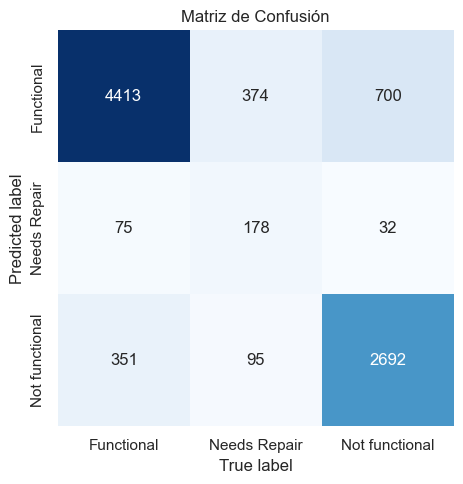

In [ ]:
mat = confusion_matrix(y_test, y_pred_stack)

labels = ['Functional', 'Needs Repair', 'Not functional']

plt.figure(figsize=(6, 5))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

Con respecto a la bilbioteca de Optuna vi que tunear con Optuna optimiza automáticamente los hiperparámetros de tu modelo de machine learning. En lugar de hacer una búsqueda manual o usar GridSearchCV, Optuna busca de forma inteligente los valores óptimos mediante técnicas como Tree-structured Parzen Estimator (TPE). 

Ensemble con Stacking

Para mejorar el rendimiento del modelo, se implementó una técnica de ensamblado (ensemble) basada en stacking, que combina las predicciones de varios modelos base. En este caso, se utilizaron tres clasificadores: un Random Forest con hiperparámetros ajustados mediante Grid Search, un LGBMClassifier optimizado con Optuna y un XGBoostClassifier sin tuning. Esta combinación busca aprovechar las fortalezas individuales de cada algoritmo para obtener una predicción más robusta. 

El modelo de stacking no solo mejoró el comportamiento frente a las clases minoritarias(vease matriz de confusión), sino que también logró un incremento en el accuracy global del modelo, lo que evidencia una mejora general en la capacidad predictiva.

## 7. Conclusión

Este es mi modelo final, el cual alcanzó una puntuación de **0.8161** en la competición. Para su desarrollo se aplicaron técnicas de ingeniería de características, codificación de variables categóricas, balanceo de clases mediante SMOTE y ajuste de hiperparámetros con Grid Search, RandomSearch y Optuna. Además, se implementó un modelo *ensemble* de stacking que combinó diferentes algoritmos para mejorar el rendimiento general. 

Es probable que la puntuación pudiera haberse incrementado aún más mediante un preprocesamiento más exhaustivo, como una selección más cuidadosa de variables, una mejor imputación de valores faltantes o el uso de transformaciones específicas para ciertos atributos. Aun así, el modelo ofrece un buen rendimiento y refleja un trabajo sólido de modelización supervisada.